### Fetching Images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import matplotlib.pyplot as plt
#User should change input nodes and hidden nodes as per input size
import tensorflow as tf
import pandas as pd
import cv2
import glob
import numpy as np
import random
from google.colab.patches import cv2_imshow

In [ ]:
sz=44
xc=11
yc=55
input_nodes=sz*sz
hidden_nodes=2000
output_nodes =sz*sz

def noisy(image):
      row,col= image.shape
      mean = 0
      var = 100
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col))
      gauss = gauss.reshape(row,col)
      noisy = image + gauss
      return noisy

In [ ]:
#fetch images
#user should change the path to their input
train_x_list=glob.glob("drive/My Drive/tdata/rbc/*.png")
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd4/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd8/*.png"))
#random.shuffle(train_x_list)
print(train_x_list)
train_images=[]
train_lis = []
x_list = []
train_lis_auginp = []
noise=[]
noise_test = []
for i in range(len(train_x_list)):
  if(i%50==0):
    x_list.append(cv2.imread(train_x_list[i],0)[xc:yc,xc:yc].flatten())
  else:
    train_lis_auginp.append(cv2.imread(train_x_list[i],0)[xc:yc,xc:yc])
    train_images.append(cv2.imread(train_x_list[i],0)[xc:yc,xc:yc].flatten())
    #noise.append(noisy(cv2.imread(train_x_list[i],0))[11:55,11:55].flatten())
    #cv2_imshow(np.resize(noise[i],(44,44)))
#saving input list before conv to np array
train_lis = train_images
train_images=np.array(train_images)
print(train_images.shape)

print(train_images)


['drive/My Drive/tdata/rbc/5 (10).png', 'drive/My Drive/tdata/rbc/5 (1).png', 'drive/My Drive/tdata/rbc/5 (100).png', 'drive/My Drive/tdata/rbc/5 (102).png', 'drive/My Drive/tdata/rbc/5 (11).png', 'drive/My Drive/tdata/rbc/5 (107).png', 'drive/My Drive/tdata/rbc/5 (105).png', 'drive/My Drive/tdata/rbc/5 (109).png', 'drive/My Drive/tdata/rbc/5 (108).png', 'drive/My Drive/tdata/rbc/5 (106).png', 'drive/My Drive/tdata/rbc/5 (101).png', 'drive/My Drive/tdata/rbc/5 (103).png', 'drive/My Drive/tdata/rbc/5 (104).png', 'drive/My Drive/tdata/rbc/5 (113).png', 'drive/My Drive/tdata/rbc/5 (119).png', 'drive/My Drive/tdata/rbc/5 (117).png', 'drive/My Drive/tdata/rbc/5 (116).png', 'drive/My Drive/tdata/rbc/5 (112).png', 'drive/My Drive/tdata/rbc/5 (118).png', 'drive/My Drive/tdata/rbc/5 (111).png', 'drive/My Drive/tdata/rbc/5 (114).png', 'drive/My Drive/tdata/rbc/5 (110).png', 'drive/My Drive/tdata/rbc/5 (115).png', 'drive/My Drive/tdata/rbc/5 (12).png', 'drive/My Drive/tdata/rbc/5 (124).png', 'dri

### Augmentation

In [ ]:
train_lis_auginp = np.array(train_lis_auginp)
train_lis_auginp = np.reshape(train_lis_auginp,(train_lis_auginp.shape[0],train_lis_auginp.shape[1],train_lis_auginp.shape[2],1))

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
k = 0
datagen = ImageDataGenerator(rotation_range=90)
it = datagen.flow(train_lis_auginp, batch_size=1)
datagen2 = ImageDataGenerator(rotation_range=180)
it2 = datagen2.flow(train_lis_auginp, batch_size=1)
datagen3 = ImageDataGenerator(rotation_range=270)
it3 = datagen3.flow(train_lis_auginp, batch_size=1)
for i in range(train_lis_auginp.shape[0]):
  img = it.next()
  img = img.flatten()
  train_lis.append(img)
  img = it2.next()
  img = img.flatten()
  train_lis.append(img)
  img = it3.next()
  img = img.flatten()
  train_lis.append(img)
random.shuffle(train_lis)
k = np.array(train_lis)
print(k.shape)

Using TensorFlow backend.


(3624, 1936)


In [ ]:
#final array is k
#% of training set
rng = k.shape[0]-(k.shape[0]//10)
noise_train_out = []
noise = []
#train_final = k[:rng]
#test_final = k[rng:]
for i in range(k.shape[0]):
  noise.append(noisy(np.reshape(train_lis[i],(sz,sz))).flatten())
  #cv2_imshow(np.resize(noise[i],(44,44)))
noise_train = np.array(noise)
#noise_train = noise_train[:rng]
#noise_test = noise_train[rng:]
#noise_train_out = k[:rng]
#noist_test_out = k[rng:]
noise_trai = noise_train
#noise_test = noise_train[2001:2010]
noise_train_out = k
#noist_test_out = k[2001:2010]
noise_test_out = np.array(x_list)
noise_test = []
for j in range(noise_test_out.shape[0]):
  #print(j)
  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())
noise_test = np.array(noise_test)

###Extreme Learnng Machine

In [ ]:
def relu(inp):
    fin=[]
    for i in range(len(inp)):
      if(inp[i]>0):
        fin.append(inp[i])
      else:
        fin.append(0.0001*inp[i])
    
    return np.array(fin)

def relud(inp):
    fin=[]
    fin=np.multiply(relu(inp),np.subtract(1,relu(inp)))
    return np.array(fin)
    

In [ ]:
w1=np.array([[random.random() for i in range(input_nodes)] for i in range(hidden_nodes)])
w2=np.array([[random.random() for i in range(hidden_nodes)] for i in range(output_nodes)])

In [ ]:
pn=[]
def mdl(x_train,diff):
    eta=0.01
    x_train=np.true_divide(x_train,255)
    diff=np.true_divide(diff,255)
    global w1,w2,pn
    #print(w1.shape,w2.shape)
    lss=[]
    pn=(np.identity(hidden_nodes)/100)
    accc=[]
    for i in range(1):
        for j in range(len(x_train[:])):
            print(j)
            #eta*=1.01
            #dfd=(x_train[j].reshape((28,28)))
            #cv2.imshow(str(j),np.array(dfd))
            y1=np.matmul(w1,x_train[j])
            #print("y1-",y1.shape)
            theta1=np.array([relu(y1)])
            #print("theta1-",theta1.shape)
            out=np.matmul(w2,theta1.T)
            #print(out)
            theta2=np.array([relu(out)])
            sm=0
            if(1):
              for k in range(len(diff[0])):
               sm+=((diff[j][k]-theta2[0][k][0])*(diff[j][k]-theta2[0][k][0]))
              accc.append(sm)
            #print("theta2-",theta4) 
            if(j==0 and i==0):
              pn=(np.identity(hidden_nodes)/10000+np.matmul(theta1.T,theta1))
            else:
              pn=pn+np.matmul(theta1.T,theta1)
            #print(pn.shape)
            opt=np.array([diff[j]])
            #print(opt.shape)
            err=(opt-np.matmul(theta1,w2.T))
            #print(err.shape)
            #print(theta1.shape)
            #pninv=np.linalg.inv(pn)
            #print(pninv.shape)
            #inerp=np.matmul(pninv,theta1.T)
            inerp=np.linalg.solve(pn,theta1.T)
            w2=w2+np.matmul(err.T,inerp.T)
            #print(w2.shape)
            #su=0
            '''for k in range(1936):
                su+=(theta2[0][k]-diff[j][k])**2
            lss.append(su)'''
            '''if(i%1==0):
              print("orig")
              #cv2_imshow(np.resize(np.multiply(x_traintime complexity of finding matrix inverse[j],255),(44,44)))
              print("recon ")
              #plt.figure(figsize=(3,3))
              #plt.imshow(np.resize(np.multiply(theta2,255),(44,44)), origin="upper",cmap="gray")
              #plt.show()
                  
              #cv2_imshow(np.resize(np.multiply(theta2,255),(44,44)))
            if(i%1==0):    
              #plt.plot(lss[:])
              #plt.show()
              print(i)'''
    plt.plot(accc[100:])
    plt.show()

In [ ]:
mdl(noise_trai,noise_train_out)
print("-------------------------------------------------------------------------------------------------------------------------------------")
print("*************************************TRAINING COMPLETE*****************************************************")

###Output of ELM


orig


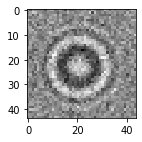

expected


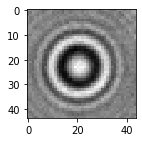

recon 


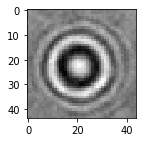

orig


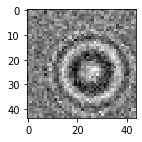

expected


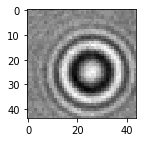

recon 


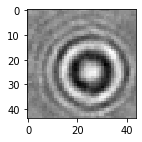

orig


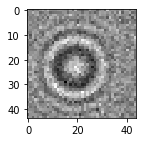

expected


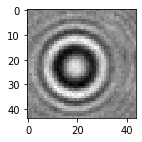

recon 


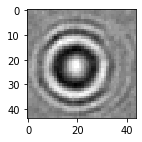

orig


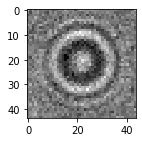

expected


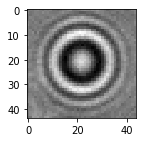

recon 


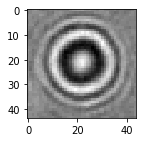

orig


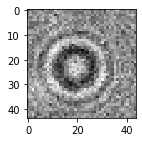

expected


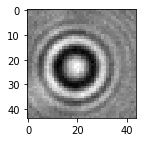

recon 


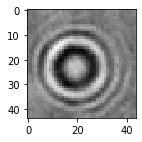

orig


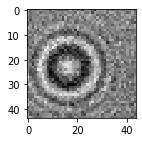

expected


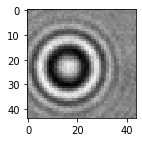

recon 


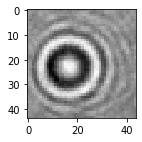

orig


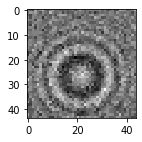

expected


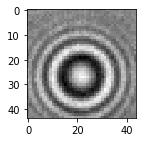

recon 


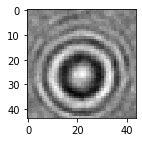

orig


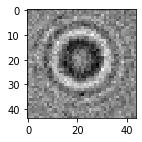

expected


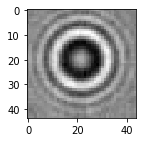

recon 


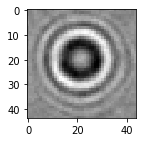

orig


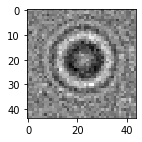

expected


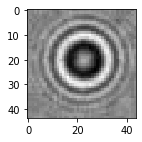

recon 


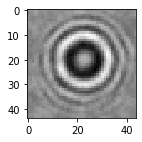

orig


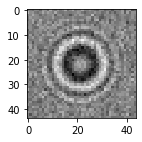

expected


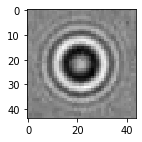

recon 


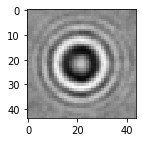

orig


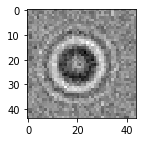

expected


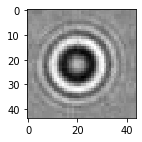

recon 


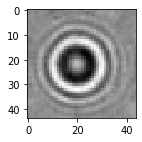

orig


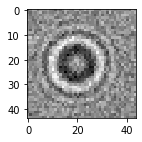

expected


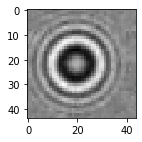

recon 


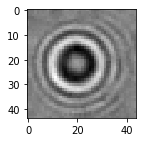

orig


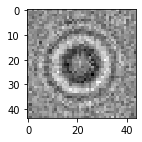

expected


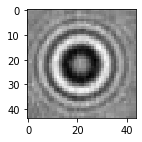

recon 


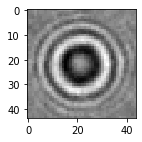

orig


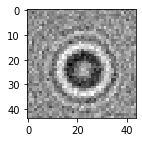

expected


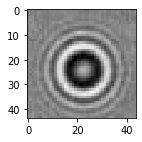

recon 


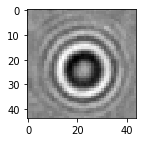

orig


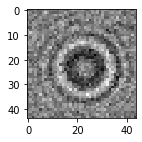

expected


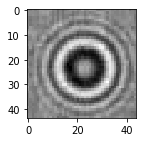

recon 


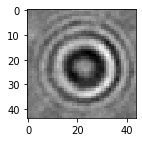

orig


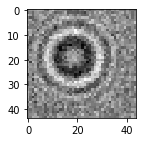

expected


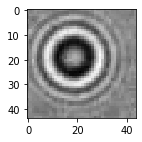

recon 


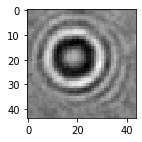

orig


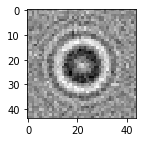

expected


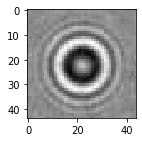

recon 


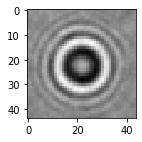

orig


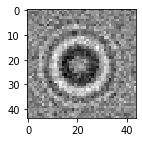

expected


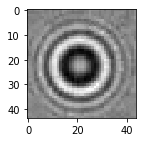

recon 


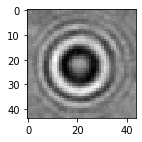

orig


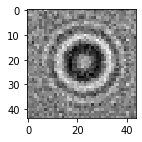

expected


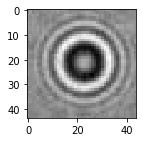

recon 


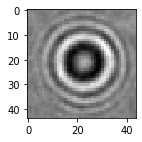

In [ ]:
import scipy
#x_test=np.true_divide(noise_test,255)
#print(x_test.shape)
recon = []
for j in range(noise_test.shape[0]):

  y1=np.matmul(w1,noise_test[j])
  #print("y1-",y1)
  theta1=relu(y1)
  #print("theta3-",theta3)
  out=np.matmul(w2,theta1)
  #print(out)
  theta2=relu(out)
  recon.append(theta2)
            
  if(j%1==0):
    print("orig")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test[j],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmnsy/elmnsy"+str(j)+".png",np.resize(noise_test[j],(44,44)),cmap='gray')
    plt.show()
    print("expected")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test_out[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test_out[j],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elminp/elminp"+str(j)+".png",np.resize(noise_test_out[j],(44,44)),cmap='gray')
    plt.show()
    #cv2_imshow(np.resize(np.multiply(noise_test[j],255),(44,44)))
    print("recon ")
    #cv2_imshow(np.resize(np.multiply(theta2,255),(44,44)))
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(np.multiply(theta2,255),(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmop/elmop"+str(j)+".png",np.resize(np.multiply(theta2,255),(44,44)),cmap='gray')
    plt.show()
    

###Calculating SNR

In [ ]:
aa = []
bb = []
cc = []
for lk in range(noise_test_out.shape[0]):
  a = noise_test_out[lk]
  a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
  aa.append(a)
  b = noise_test[lk]
  b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
  bb.append(b)
  c = recon[lk]
  #c = np.true_divide(recon,255)
  c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
  cc.append(c)
aa = np.array(aa)
bb = np.array(bb)
cc = np.array(cc)
print(np.amax(bb))

import math
import matplotlib.pyplot as pypt
def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[22][:]
        l = noisar[22][:]
        m = reconar[22][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar
snratio = []
snrinar = []
snroutar =  []
snratio,snrinar,snroutar = snr5(aa,bb,cc)
print("SNR 5")
print(snratio)
print(snrinar)
print(snroutar)
print(np.mean(snratio))
print(np.mean(snrinar))
print(np.mean(snroutar))

1.0
SNR 5
[7.587593333257445, 6.2837399968413195, 6.569442383443333, 4.665708610225639, 3.9948872806219686, 4.9909624520217175, 5.2479612897420225, 7.444111823746837, 5.342547995305923, 1.9044658930154093, 6.975546614170193, 5.025292253103107, 6.622987053354066, 7.7905433798156825, 4.879309374599488, 4.2672163694764045, 6.246105396184825, 5.918112467999702, 2.170924534455004]
[13.709955167688413, 13.576787068469653, 12.818084301063744, 13.173871596105577, 12.686360608917573, 14.48681782314807, 11.453139468410907, 15.377243663111265, 15.674976192101484, 16.9135674263609, 14.651291552990154, 13.660794852149237, 13.083082981286758, 12.292976585589736, 12.065583603231238, 13.466066453844324, 15.894304369013879, 14.547857518662042, 15.22598183981233]
[21.297548500945858, 19.860527065310972, 19.387526684507076, 17.839580206331217, 16.68124788953954, 19.47778027516979, 16.70110075815293, 22.821355486858103, 21.017524187407407, 18.81803331937631, 21.626838167160347, 18.686087105252344, 19.7060

In [ ]:
'''trl=(glob.glob("drive/My Drive/tdata/10/*.png"))
import scipy
import math
import matplotlib.pyplot as pypt

train_images=[]
train_lis = []
x_list = []
noise=[]
noise_test = []
for i in range(len(trl)):
  if(i%1==0):
    x_list.append(cv2.imread(trl[i],0)[xc:yc,xc:yc].flatten())

noise = []
noise_test_out = np.array(x_list)
noise_test = []
for j in range(noise_test_out.shape[0]):
  #print(j)
  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())
noise_test = np.array(noise_test)

def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[22][:]
        l = noisar[22][:]
        m = reconar[22][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar

snrlist=[]
#pn=(np.identity(hidden_nodes))
for j in range(len(trl)-20):
  y1=np.matmul(w1,noise_test[j])
  theta1=np.array([relu(y1)])
  out=np.matmul(w2,theta1.T)
  theta2=np.array([relu(out)])
  #print("theta2-",theta4) 
  #if(j==0 and i==0):
  #pn=(np.identity(hidden_nodes)/10000+np.matmul(theta1.T,theta1))
  #else:
  pn=pn+np.matmul(theta1.T,theta1)
  #print(pn.shape)
  opt=np.array([noise_test_out[j]])
  #print(opt.shape)
  err=(opt-np.matmul(theta1,w2.T))
  #inerp=np.matmul(pninv,theta1.T) \
  inerp=np.linalg.solve(pn,theta1.T)
  w2=w2+np.matmul(err.T,inerp.T)
  #noise_test=noise_test[:len(noise_test)-1]
  #noise_test_out=noise_test_out[:len(noise_test_out)-1]
recon = []
for i in range(len(trl)-20,len(trl)):
  y1=np.matmul(w1,noise_test[i])
  theta1=relu(y1)
  out=np.matmul(w2,theta1)
  theta2=relu(out)
  recon.append(theta2)         
  print("orig")
  #plt.figure(figsize=(3,3))
  #plt.imshow(np.resize(np.multiply(noise_test[j],255),(44,44)), origin="upper",cmap="gray")
  #plt.show()
  plt.figure(figsize=(2,2))
  plt.imshow(np.resize(noise_test[i],(sz,sz)),cmap="gray")
  #plt.imsave("drive/My Drive/elmnsy/elmnsy"+str(j)+".png",np.resize(noise_test[j],(44,44)),cmap='gray')
  plt.show()
  print("expected")
  #plt.figure(figsize=(3,3))
  #plt.imshow(np.resize(np.multiply(noise_test_out[j],255),(44,44)), origin="upper",cmap="gray")
  #plt.show()
  plt.figure(figsize=(2,2))
  plt.imshow(np.resize(noise_test_out[i],(sz,sz)),cmap="gray")
  #plt.imsave("drive/My Drive/elminp/elminp"+str(j)+".png",np.resize(noise_test_out[j],(44,44)),cmap='gray')
  plt.show()
  #cv2_imshow(np.resize(np.multiply(noise_test[j],255),(44,44)))
  print("recon ")
  #cv2_imshow(np.resize(np.multiply(theta2,255),(44,44)))
  plt.figure(figsize=(2,2))
  plt.imshow(np.resize(np.multiply(theta2,255),(sz,sz)),cmap="gray")
  #plt.imsave("drive/My Drive/elmop/elmop"+str(j)+".png",np.resize(np.multiply(theta2,255),(44,44)),cmap='gray')
  plt.show()
aa = []
bb = []
cc = []
for lk in range(20):
  a = noise_test_out[len(trl)-20+lk]
  a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
  aa.append(a)
  b = noise_test[len(trl)-20+lk]
  b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
  bb.append(b)
  c = recon[lk]
  #c = np.true_divide(recon,255)
  c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
  cc.append(c)
aa = np.array(aa)
bb = np.array(bb)
cc = np.array(cc)
snratio = []
snrinar = []
snroutar =  []
snratio,snrinar,snroutar = snr5(aa,bb,cc)
snrlist.append(np.mean(snratio))
print(snratio)
print(snrinar)
print(snroutar)
print(np.mean(snratio))
print(np.mean(snrinar))
print(np.mean(snroutar))'''

'trl=(glob.glob("drive/My Drive/tdata/10/*.png"))\nimport scipy\nimport math\nimport matplotlib.pyplot as pypt\n\ntrain_images=[]\ntrain_lis = []\nx_list = []\nnoise=[]\nnoise_test = []\nfor i in range(len(trl)):\n  if(i%1==0):\n    x_list.append(cv2.imread(trl[i],0)[xc:yc,xc:yc].flatten())\n\nnoise = []\nnoise_test_out = np.array(x_list)\nnoise_test = []\nfor j in range(noise_test_out.shape[0]):\n  #print(j)\n  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())\nnoise_test = np.array(noise_test)\n\ndef snr5(imgarr,noisarr,reconarr):\n    imgar = []\n    noisar  = []\n    reconar = []\n    snrfinal = []\n    snr = []\n    a = []\n    b = []\n    k = []\n    l = []\n    m = []\n    snrinar = []\n    snroutar = []\n    for t in range(imgarr.shape[0]):\n        imgar = imgarr[t].reshape(sz,sz)\n        noisar = noisarr[t].reshape(sz,sz)\n        reconar = reconarr[t].reshape(sz,sz)\n        k = imgar[22][:]\n        l = noisar[22][:]\n        m = reconar[22][:]\n   

###Transfer Learning on ELM

In [ ]:
trl=(glob.glob("drive/My Drive/tdata/20/*.png"))
import scipy
import math
import matplotlib.pyplot as pypt
x_list = []
noise=[]
noise_test = []
for i in range(len(trl)):
  if(i%1==0):
    x_list.append(cv2.imread(trl[i],0)[xc:yc,xc:yc].flatten())
/usr/local/lib/python3.6/dist-packages/keras/engine/training_utils.py in check_array_length_consistency(inputs, targets, weights)
    238                          'the same number of samples as target arrays. '
    239                          'Found ' + str(list(set_x)[0]) + ' input samples '
--> 240                          'and ' + str(list(se
noise = []
noise_train_out= np.array(x_list[20:])
noise_train=[]
noise_test_out = np.array(x_list[:20])
noise_test = []
for j in range(noise_test_out.shape[0]):
  #print(j)
  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())
for j in range(noise_train_out.shape[0]):
  #print(j)
  noise_train.append(noisy(np.reshape(noise_train_out[j],(sz,sz))).flatten())
noise_test = np.array(noise_test)
noise_train=np.array(noise_train)
def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[22][:]
        l = noisar[22][:]
        m = reconar[22][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar

snrlist=[]
#pn=(np.identity(hidden_nodes))
for j in range(noise_train_out.shape[0]):
  y1=np.matmul(w1,noise_train[j])
  theta1=np.array([relu(y1)])
  out=np.matmul(w2,theta1.T)
  theta2=np.array([relu(out)])
  #print("theta2-",theta4) 
  #if(j==0 and i==0):
  #pn=(np.identity(hidden_nodes)/10000+np.matmul(theta1.T,theta1))
  #else:
  pn=pn+np.matmul(theta1.T,theta1)
  #print(pn.shape)
  opt=np.array([noise_train_out[j]])
  #print(opt.shape)
  err=(opt-np.matmul(theta1,w2.T))
  #inerp=np.matmul(pninv,theta1.T) \
  inerp=np.linalg.solve(pn,theta1.T)
  w2=w2+np.matmul(err.T,inerp.T)
  #noise_test=noise_test[:len(noise_test)-1]
  #noise_test_out=noise_test_out[:len(noise_test_out)-1]
  recon = []
  for i in range(noise_test_out.shape[0]):
    y1=np.matmul(w1,noise_test[i])
    theta1=relu(y1)
    out=np.matmul(w2,theta1)
    theta2=relu(out)
    recon.append(theta2)         
    '''print("orig")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test[i],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmnsy/elmnsy"+str(j)+".png",np.resize(noise_test[j],(44,44)),cmap='gray')
    plt.show()
    print("expected")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test_out[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test_out[i],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elminp/elminp"+str(j)+".png",np.resize(noise_test_out[j],(44,44)),cmap='gray')
    plt.show()
    #cv2_imshow(np.resize(np.multiply(noise_test[j],255),(44,44)))
    print("recon ")
    #cv2_imshow(np.resize(np.multiply(theta2,255),(44,44)))
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(np.multiply(theta2,255),(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmop/elmop"+str(j)+".png",np.resize(np.multiply(theta2,255),(44,44)),cmap='gray')
    plt.show()'''
  aa = []
  bb = []
  cc = []
  for lk in range(noise_test_out.shape[0]):
    a = noise_test_out[lk]
    a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
    aa.append(a)
    b = noise_test[lk]
    b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
    bb.append(b)
    c = recon[lk]
    #c = np.true_divide(recon,255)
    c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
    cc.append(c)
  aa = np.array(aa)
  bb = np.array(bb)
  cc = np.array(cc)
  snratio = []
  snrinar = []
  snroutar =  []
  snratio,snrinar,snroutar = snr5(aa,bb,cc)
  snrlist.append(np.mean(snratio))
  print(snratio)
  print(snrinar)
  print(snroutar)
  print(np.mean(snratio))
  print(np.mean(snrinar))
  print(np.mean(snroutar))

[5.337393682465461, 2.3889158539026667, 1.4361360705034656, 0.17264010467288315, 4.380514283882281, 5.297010416029561, 0.10811096628345496, -4.634410108417825, -1.5142390927868021, 2.4030843190923363, 5.93602524932281, 2.7882724369059204, 0.8030238366012767, 5.4799936296906715, 2.4240533365246115, 6.421587051592159, 3.7999258989693097, 5.882890423864815, 2.5504571202358726, 3.9649443667802196]
[18.244794922056677, 16.358879823792474, 18.64378584633591, 18.85532941972965, 17.002869685191204, 18.37728247153512, 18.375967432578136, 20.637450133439145, 17.83703697179274, 19.269881141075317, 14.973517083114434, 18.0506064565611, 18.651829932481437, 17.698072846541862, 18.590960117487356, 17.415693578507234, 16.530070283433815, 17.27463113102885, 18.255589425575206, 17.578972857547875]
[23.582188604522138, 18.74779567769514, 20.079921916839375, 19.027969524402533, 21.383383969073485, 23.674292887564683, 18.48407839886159, 16.00304002502132, 16.32279787900594, 21.672965460167653, 20.909542332

In [ ]:
print(snrlist)

[2.7713164923057567, 3.2890529728049245, 3.113700943449308, 3.437734395608713, 3.6362039467175693, 3.5184084757456318, 3.6559173559529397, 3.645164184416596, 3.6623419339768915, 3.8020290360942584, 3.6120065277299354, 3.66659443219461, 3.5526175883365325, 3.614081034635357, 3.681138177938297, 3.6393390477475167, 3.734546011034103, 3.7658013589389854, 3.8173909546773386, 3.8674133595209716, 3.819020391504272, 3.8375256679456924, 3.8003212525695913, 3.9171195395998013, 3.913387411532752, 3.916722965671051, 4.00666425260992, 3.958306310167976, 3.9481813013314997, 4.142830297766736, 4.126342438550807, 4.070668840357214, 4.091453052116238, 4.09199509102141, 4.044889507955495, 4.057076552766551, 3.9981356803587205, 3.960186543766439, 4.025886220451843, 4.046248659683107, 4.048274652080349, 4.039040728653771, 4.110717756363853, 4.102119206845616, 4.097733615678403, 4.152167812478847, 4.181664380819398, 4.171461753304974, 4.18809772701466, 4.190613424572112, 4.171541995598117, 4.21322267402431

###Extras

['drive/My Drive/tdata/rbc/5 (10).png', 'drive/My Drive/tdata/rbc/5 (1).png', 'drive/My Drive/tdata/rbc/5 (100).png', 'drive/My Drive/tdata/rbc/5 (102).png', 'drive/My Drive/tdata/rbc/5 (11).png', 'drive/My Drive/tdata/rbc/5 (107).png', 'drive/My Drive/tdata/rbc/5 (105).png', 'drive/My Drive/tdata/rbc/5 (109).png', 'drive/My Drive/tdata/rbc/5 (108).png', 'drive/My Drive/tdata/rbc/5 (106).png', 'drive/My Drive/tdata/rbc/5 (101).png', 'drive/My Drive/tdata/rbc/5 (103).png', 'drive/My Drive/tdata/rbc/5 (104).png', 'drive/My Drive/tdata/rbc/5 (113).png', 'drive/My Drive/tdata/rbc/5 (119).png', 'drive/My Drive/tdata/rbc/5 (117).png', 'drive/My Drive/tdata/rbc/5 (116).png', 'drive/My Drive/tdata/rbc/5 (112).png', 'drive/My Drive/tdata/rbc/5 (118).png', 'drive/My Drive/tdata/rbc/5 (111).png', 'drive/My Drive/tdata/rbc/5 (114).png', 'drive/My Drive/tdata/rbc/5 (110).png', 'drive/My Drive/tdata/rbc/5 (115).png', 'drive/My Drive/tdata/rbc/5 (12).png', 'drive/My Drive/tdata/rbc/5 (124).png', 'dri

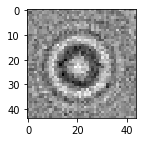

expected


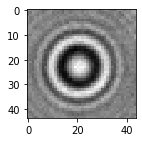

recon 


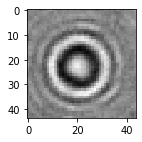

orig


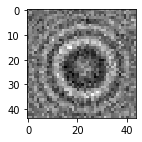

expected


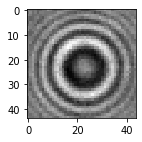

recon 


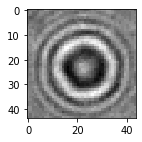

orig


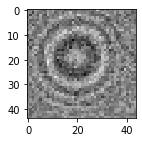

expected


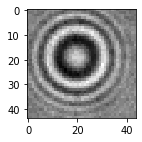

recon 


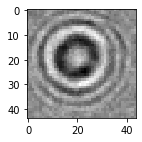

orig


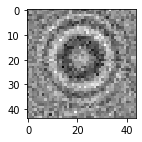

expected


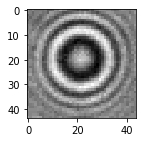

recon 


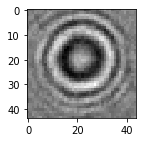

orig


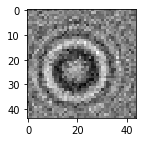

expected


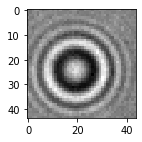

recon 


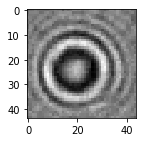

orig


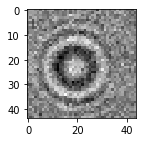

expected


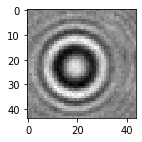

recon 


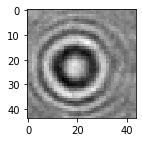

orig


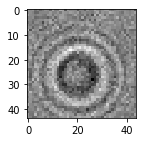

expected


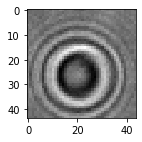

recon 


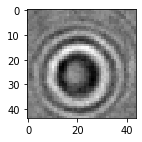

orig


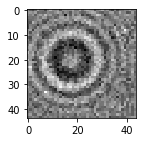

expected


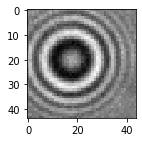

recon 


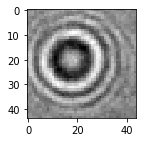

orig


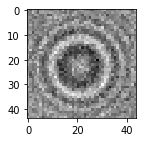

expected


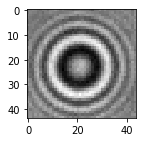

recon 


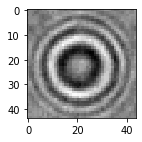

orig


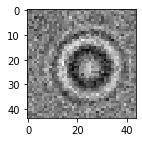

expected


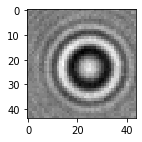

recon 


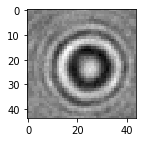

orig


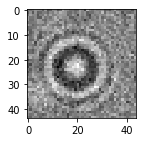

expected


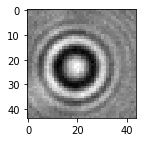

recon 


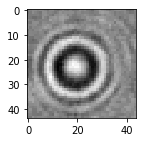

orig


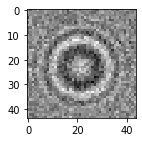

expected


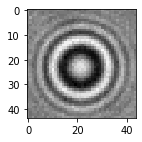

recon 


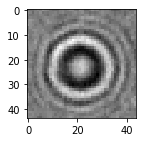

orig


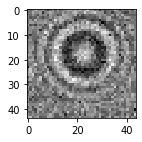

expected


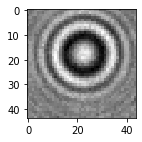

recon 


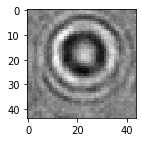

orig


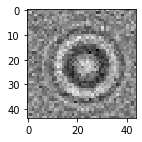

expected


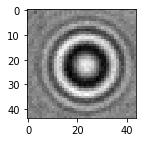

recon 


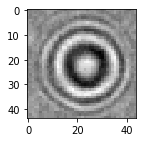

orig


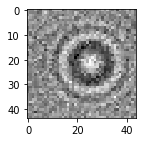

expected


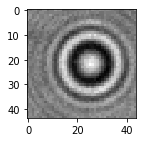

recon 


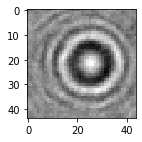

orig


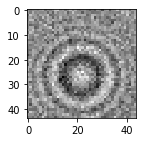

expected


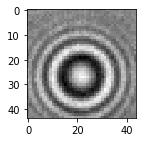

recon 


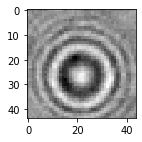

orig


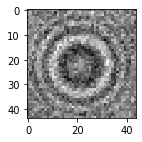

expected


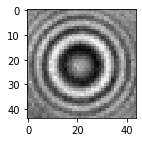

recon 


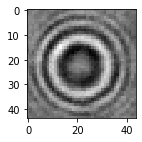

orig


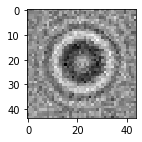

expected


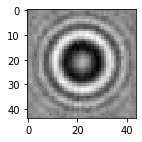

recon 


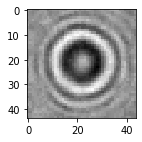

orig


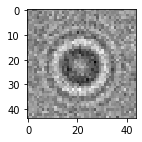

expected


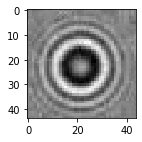

recon 


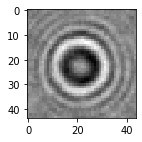

orig


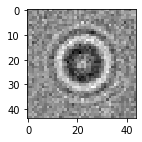

expected


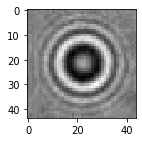

recon 


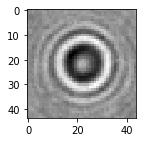

orig


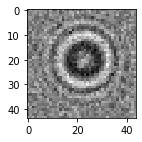

expected


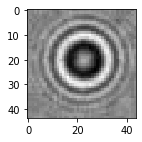

recon 


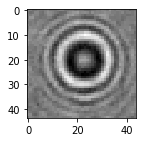

orig


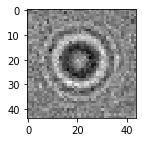

expected


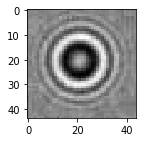

recon 


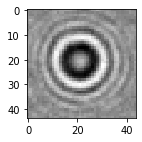

orig


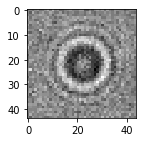

expected


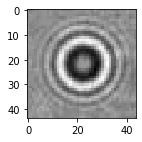

recon 


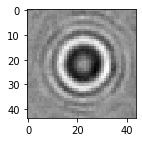

orig


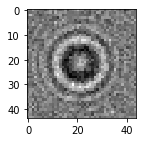

expected


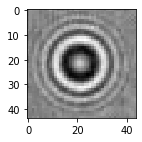

recon 


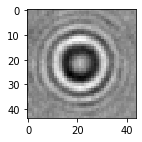

orig


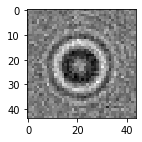

expected


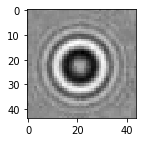

recon 


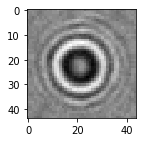

orig


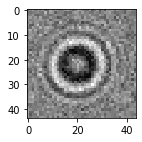

expected


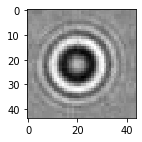

recon 


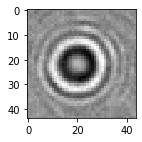

orig


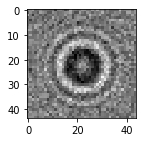

expected


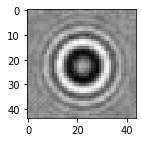

recon 


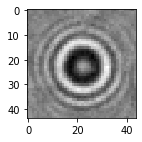

orig


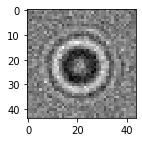

expected


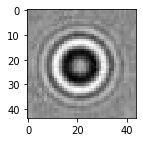

recon 


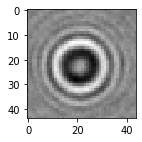

orig


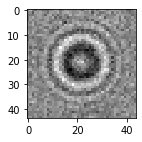

expected


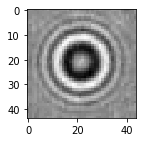

recon 


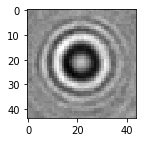

orig


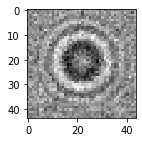

expected


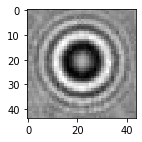

recon 


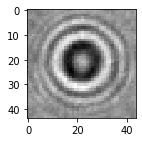

orig


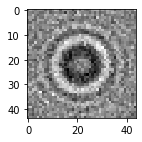

expected


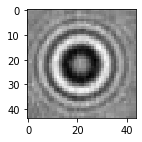

recon 


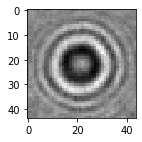

orig


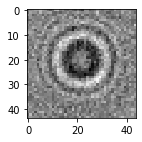

expected


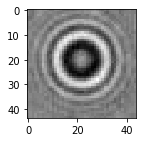

recon 


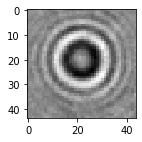

orig


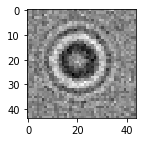

expected


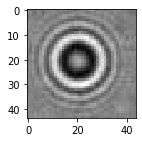

recon 


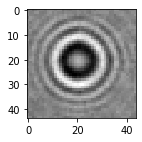

orig


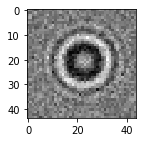

expected


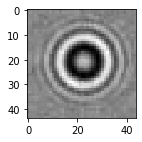

recon 


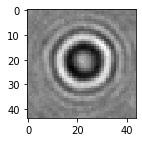

orig


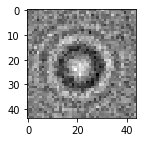

expected


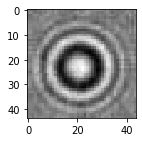

recon 


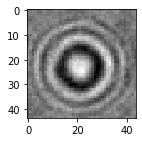

orig


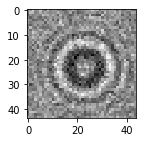

expected


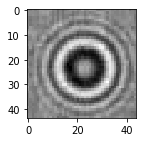

recon 


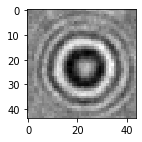

orig


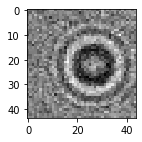

expected


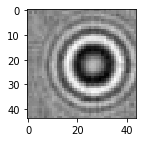

recon 


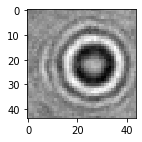

orig


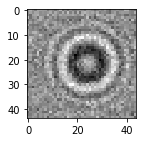

expected


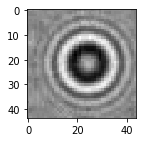

recon 


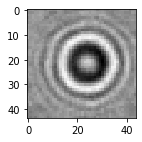

orig


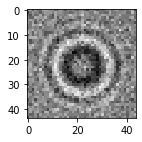

expected


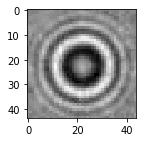

recon 


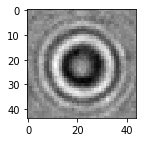

orig


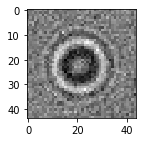

expected


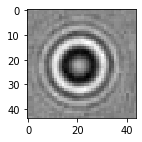

recon 


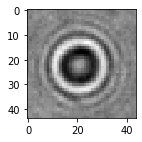

orig


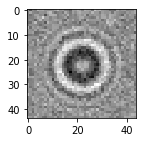

expected


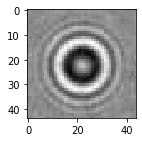

recon 


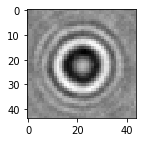

orig


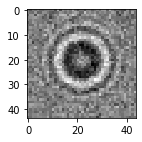

expected


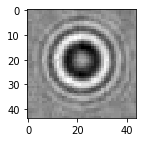

recon 


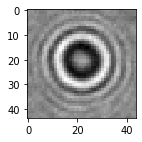

orig


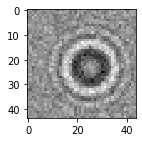

expected


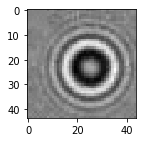

recon 


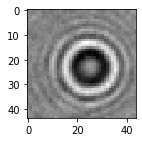

orig


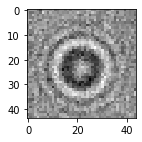

expected


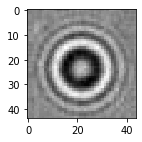

recon 


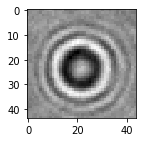

orig


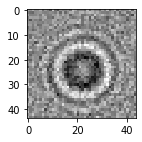

expected


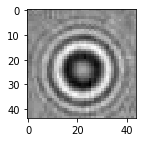

recon 


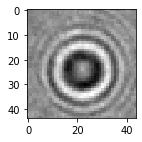

orig


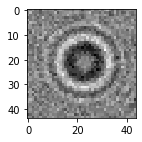

expected


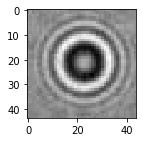

recon 


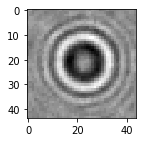

orig


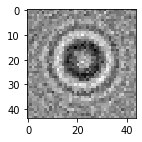

expected


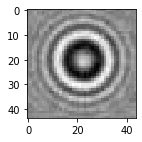

recon 


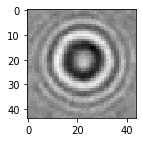

1.0
SNR 5
[4.121727559586391, 4.136950762735138, 3.665737485795674, 4.632507587095217, 4.214384766564198, 4.59797126127517, 3.547610888523078, 4.631890352674102, 7.9770819100481045, 2.9694774705555105, 3.6406096738283242, 3.8986473625928806, 4.568038668919536, 5.235613061015757, 3.264506134911027, 4.624033666531908, 1.681763378217692, 6.592959388016723, 7.546100352591289, 2.516835656985039, 4.647867776405073, 2.5061705914548877, 5.691346784853284, 5.050427112882126, 2.674864421971588, 4.208116593353985, 4.871113298663676, 3.985940637817391, 2.7305339399036477, 4.068217419594941, 5.810111846928615, 4.486534350056676, 5.5981943621081935, 4.548890376906964, 4.0406363765867575, 4.806887948294095, 4.184574613325813, 2.956832050302319, 3.909052669923268, 5.929439244406094, 4.640763956814396, 4.997893412026492, 7.261974805729825, 6.244069421255862, 7.366575530784722, 5.401123426336099, 5.133267222908817]
[13.737160239333493, 11.12684360308608, 10.79497160309976, 12.096632142023376, 12.7982890

In [ ]:
train_x_list=glob.glob("drive/My Drive/tdata/rbc/*.png")
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd4/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd8/*.png"))
#random.shuffle(train_x_list)
print(train_x_list)
train_images=[]
train_lis = []
x_list = []
train_lis_auginp = []
noise=[]
noise_test = []
for i in range(len(train_x_list)):
  if(i%20==0):
    x_list.append(cv2.imread(train_x_list[i],0)[xc:yc,xc:yc].flatten())


noise_test_out = np.array(x_list)
noise_test = []
for j in range(noise_test_out.shape[0]):
  #print(j)
  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())
noise_test = np.array(noise_test)

import scipy
#x_test=np.true_divide(noise_test,255)
#print(x_test.shape)
recon = []
for j in range(noise_test.shape[0]):

  y1=np.matmul(w1,noise_test[j])
  #print("y1-",y1)
  theta1=relu(y1)
  #print("theta3-",theta3)
  out=np.matmul(w2,theta1)
  #print(out)
  theta2=relu(out)
  recon.append(theta2)
            
  if(j%1==0):
    print("orig")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test[j],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmnsy/elmnsy"+str(j)+".png",np.resize(noise_test[j],(44,44)),cmap='gray')
    plt.show()
    print("expected")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test_out[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test_out[j],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elminp/elminp"+str(j)+".png",np.resize(noise_test_out[j],(44,44)),cmap='gray')
    plt.show()
    #cv2_imshow(np.resize(np.multiply(noise_test[j],255),(44,44)))
    print("recon ")
    #cv2_imshow(np.resize(np.multiply(theta2,255),(44,44)))
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(np.multiply(theta2,255),(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmop/elmop"+str(j)+".png",np.resize(np.multiply(theta2,255),(44,44)),cmap='gray')
    plt.show()

aa = []
bb = []
cc = []
for lk in range(noise_test_out.shape[0]):
  a = noise_test_out[lk]
  a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
  aa.append(a)
  b = noise_test[lk]
  b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
  bb.append(b)
  c = recon[lk]
  #c = np.true_divide(recon,255)
  c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
  cc.append(c)
aa = np.array(aa)
bb = np.array(bb)
cc = np.array(cc)
print(np.amax(bb))

import math
import matplotlib.pyplot as pypt
def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[22][:]
        l = noisar[22][:]
        m = reconar[22][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar
snratio = []
snrinar = []
snroutar =  []
snratio,snrinar,snroutar = snr5(aa,bb,cc)
print("SNR 5")
print(snratio)
print(snrinar)
print(snroutar)
print(np.mean(snratio))
print(np.mean(snrinar))
print(np.mean(snroutar))
    

(237, 1936)
orig


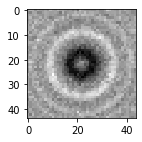

expected


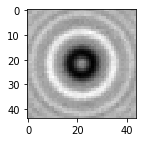

recon 


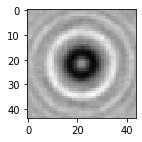

orig


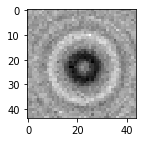

expected


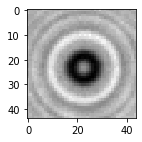

recon 


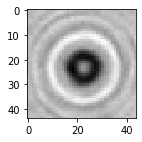

orig


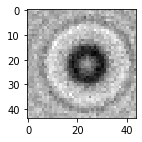

expected


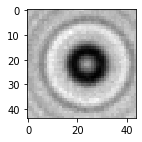

recon 


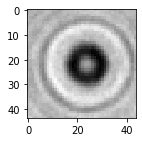

orig


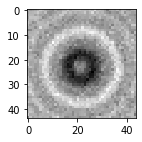

expected


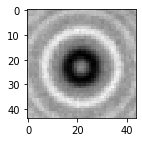

recon 


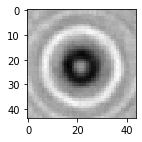

orig


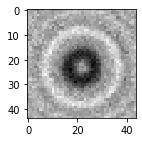

expected


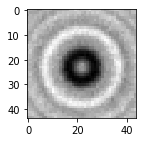

recon 


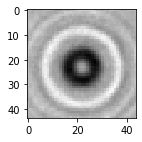

orig


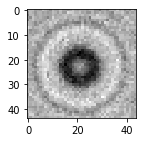

expected


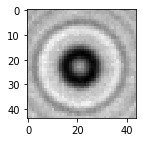

recon 


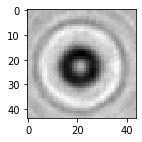

orig


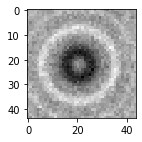

expected


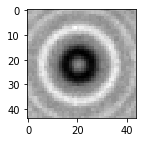

recon 


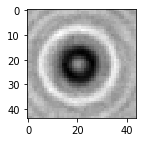

orig


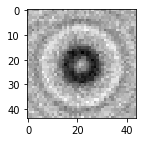

expected


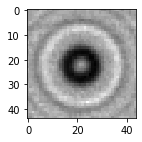

recon 


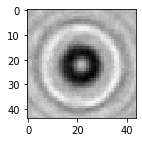

orig


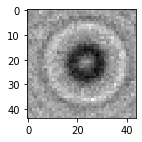

expected


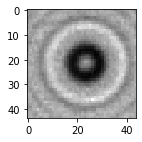

recon 


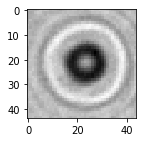

orig


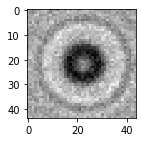

expected


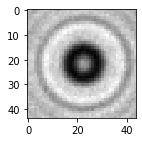

recon 


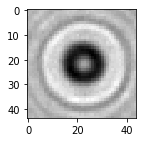

orig


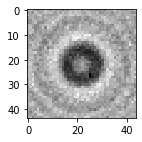

expected


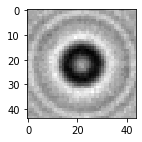

recon 


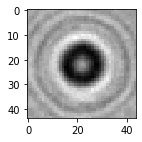

orig


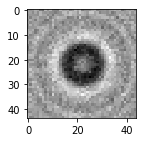

expected


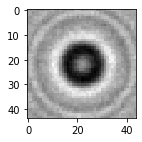

recon 


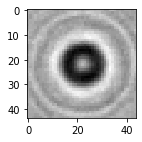

orig


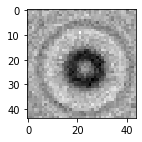

expected


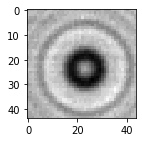

recon 


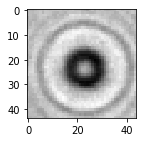

orig


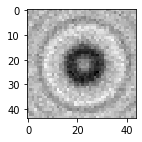

expected


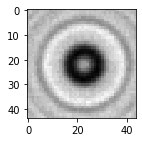

recon 


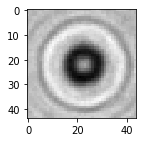

orig


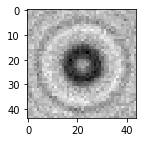

expected


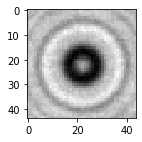

recon 


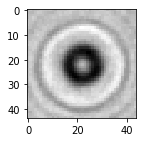

orig


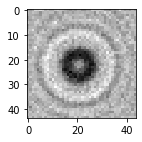

expected


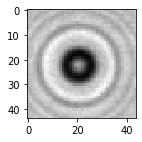

recon 


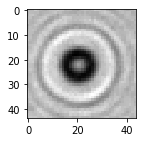

orig


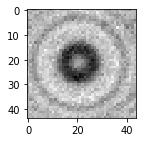

expected


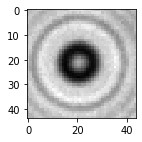

recon 


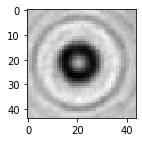

orig


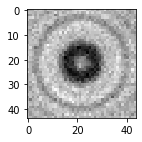

expected


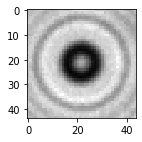

recon 


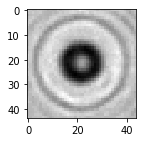

orig


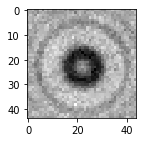

expected


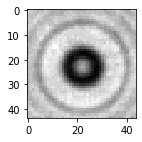

recon 


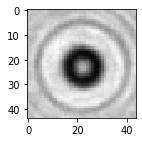

orig


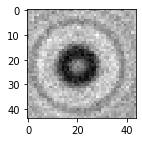

expected


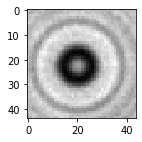

recon 


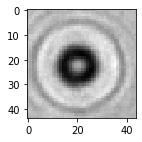

orig


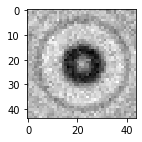

expected


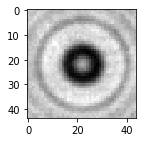

recon 


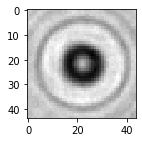

orig


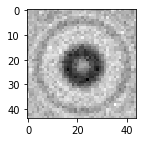

expected


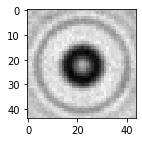

recon 


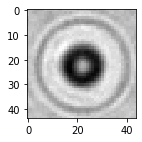

orig


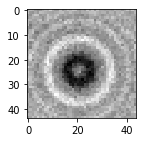

expected


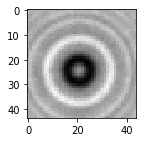

recon 


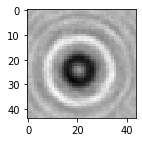

orig


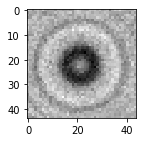

expected


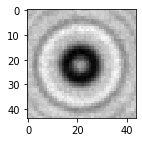

recon 


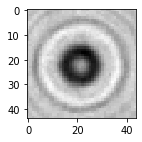

orig


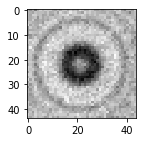

expected


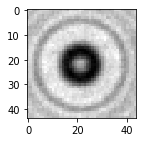

recon 


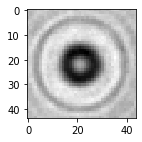

orig


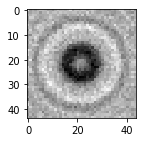

expected


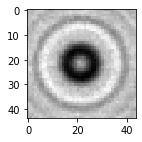

recon 


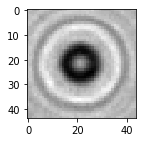

orig


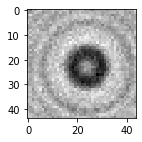

expected


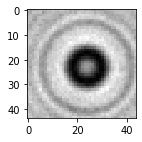

recon 


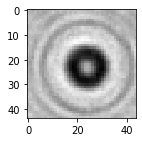

orig


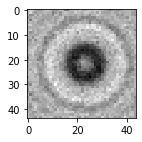

expected


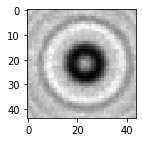

recon 


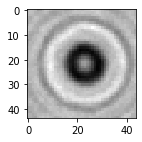

orig


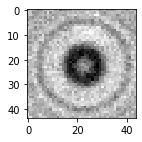

expected


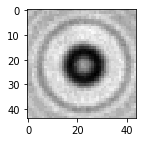

recon 


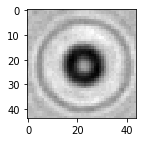

orig


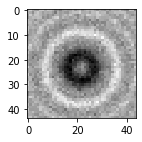

expected


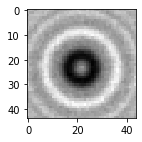

recon 


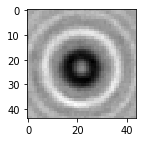

orig


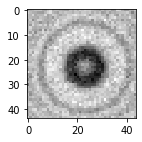

expected


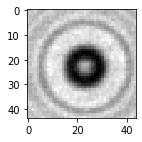

recon 


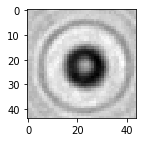

orig


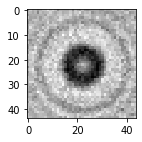

expected


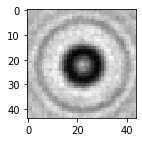

recon 


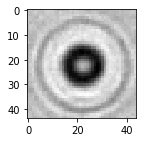

orig


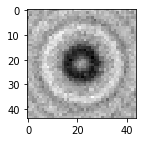

expected


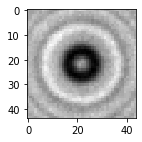

recon 


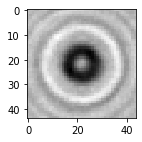

orig


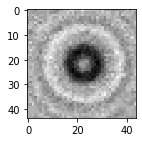

expected


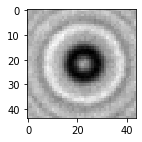

recon 


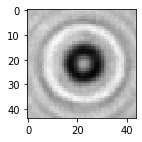

orig


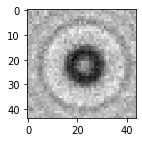

expected


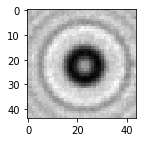

recon 


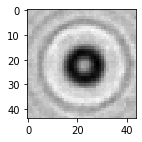

orig


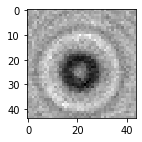

expected


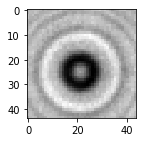

recon 


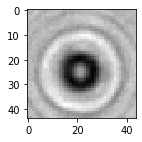

orig


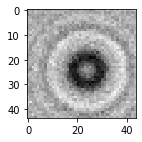

expected


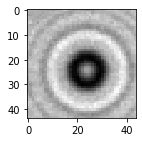

recon 


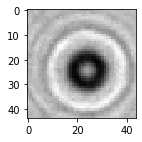

orig


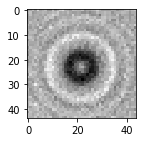

expected


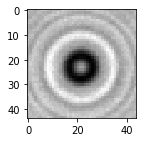

recon 


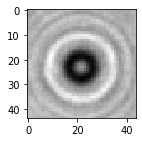

orig


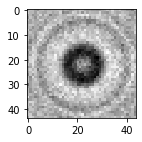

expected


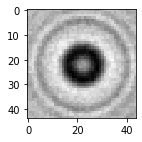

recon 


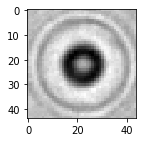

orig


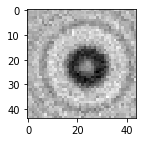

expected


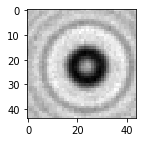

recon 


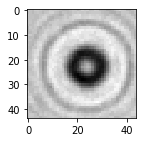

orig


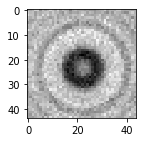

expected


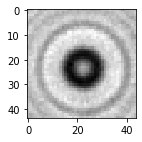

recon 


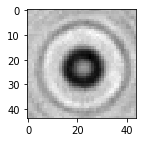

orig


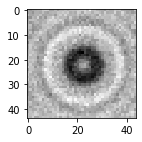

expected


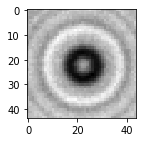

recon 


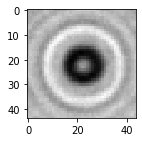

orig


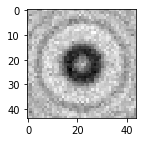

expected


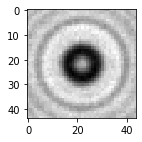

recon 


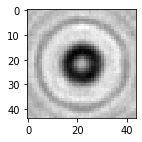

orig


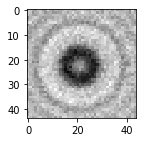

expected


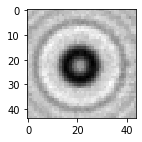

recon 


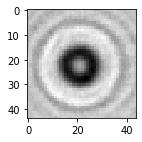

orig


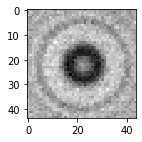

expected


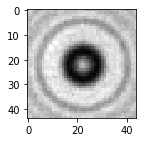

recon 


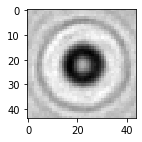

orig


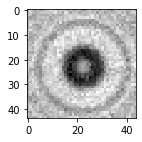

expected


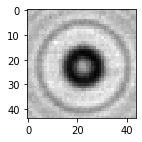

recon 


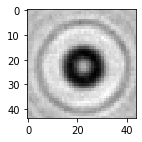

orig


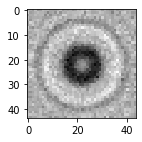

expected


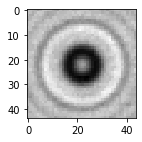

recon 


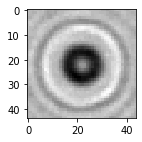

orig


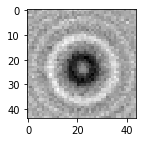

expected


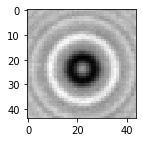

recon 


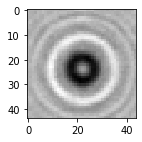

orig


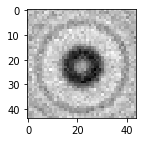

expected


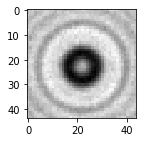

recon 


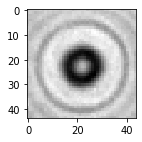

orig


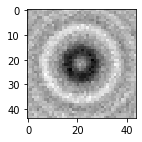

expected


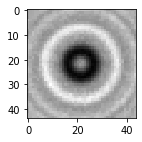

recon 


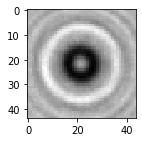

orig


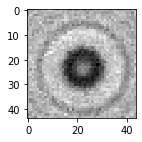

expected


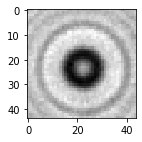

recon 


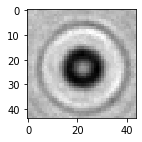

orig


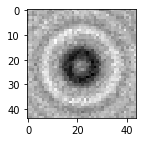

expected


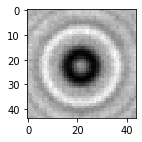

recon 


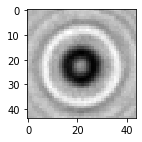

orig


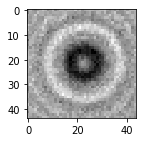

expected


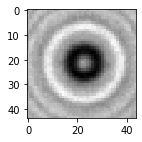

recon 


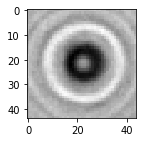

orig


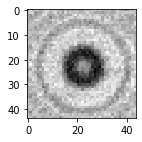

expected


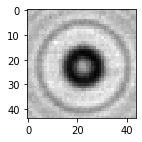

recon 


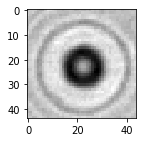

orig


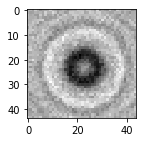

expected


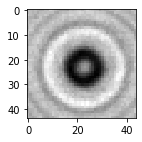

recon 


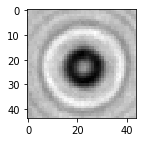

orig


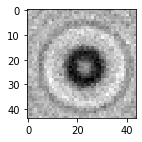

expected


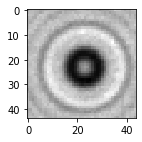

recon 


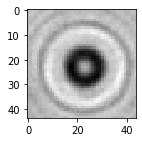

orig


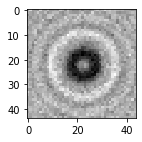

expected


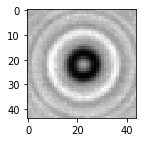

recon 


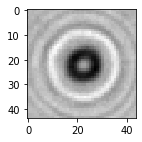

orig


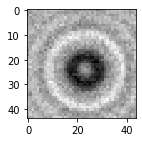

expected


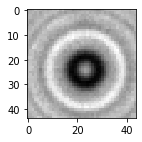

recon 


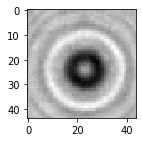

orig


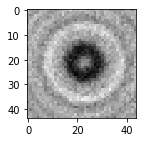

expected


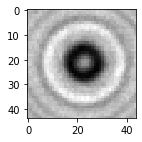

recon 


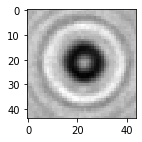

orig


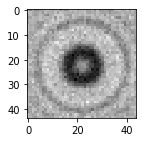

expected


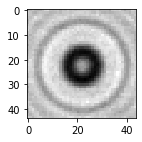

recon 


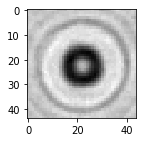

orig


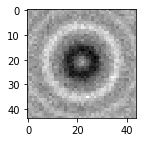

expected


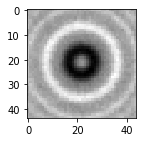

recon 


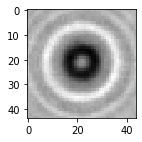

orig


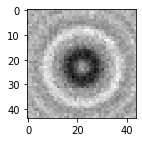

expected


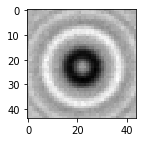

recon 


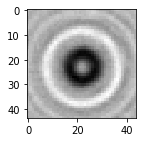

orig


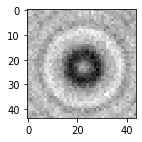

expected


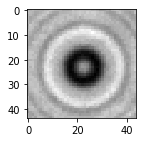

recon 


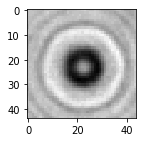

orig


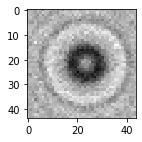

expected


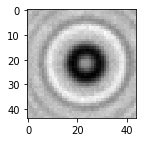

recon 


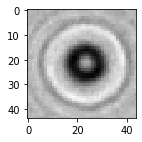

orig


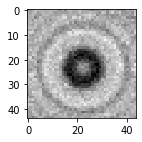

expected


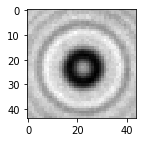

recon 


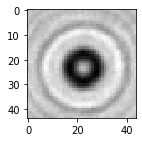

orig


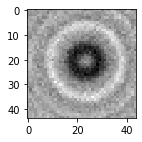

expected


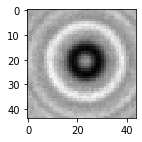

recon 


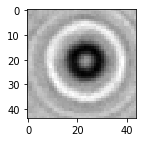

orig


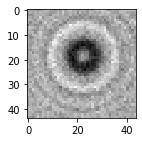

expected


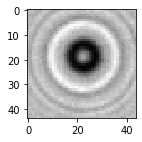

recon 


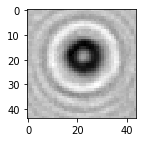

orig


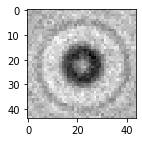

expected


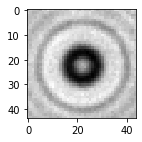

recon 


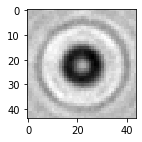

orig


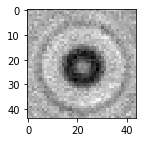

expected


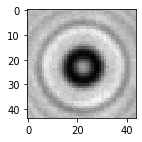

recon 


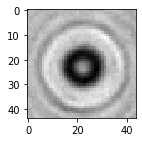

orig


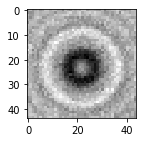

expected


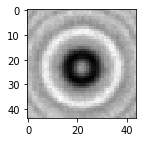

recon 


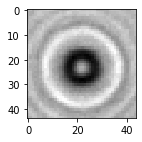

orig


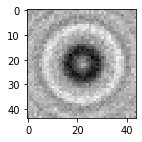

expected


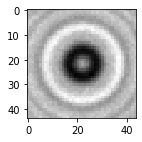

recon 


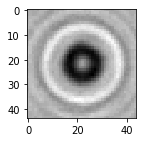

orig


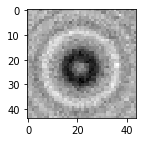

expected


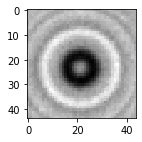

recon 


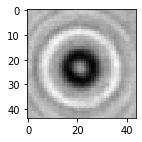

orig


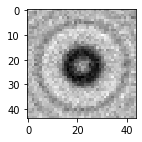

expected


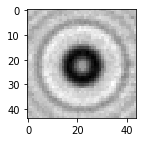

recon 


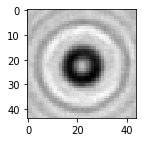

orig


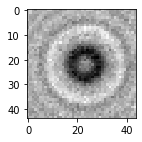

expected


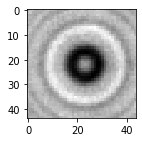

recon 


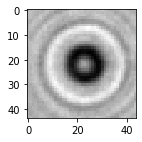

orig


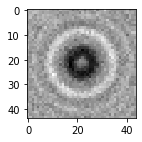

expected


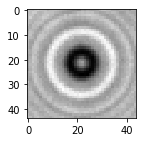

recon 


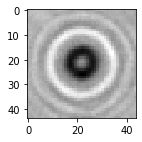

orig


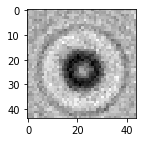

expected


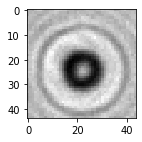

recon 


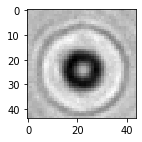

orig


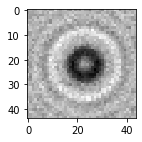

expected


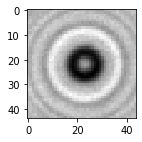

recon 


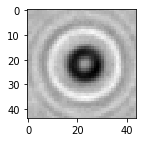

orig


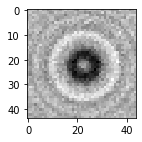

expected


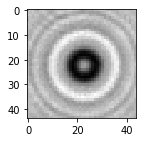

recon 


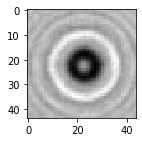

orig


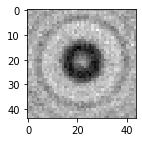

expected


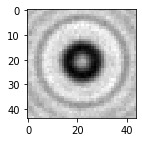

recon 


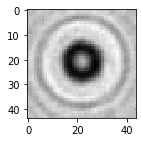

orig


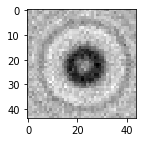

expected


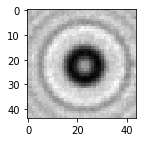

recon 


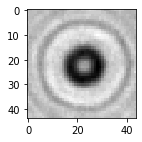

orig


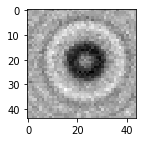

expected


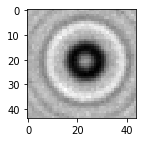

recon 


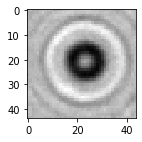

orig


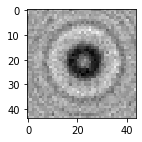

expected


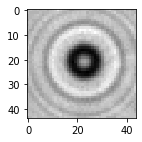

recon 


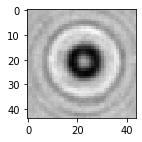

orig


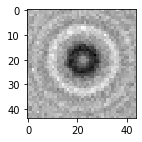

expected


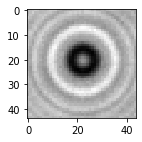

recon 


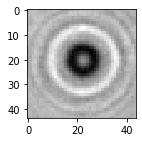

orig


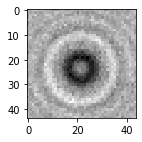

expected


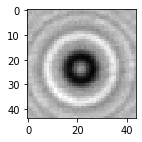

recon 


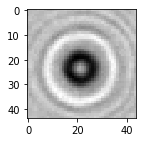

orig


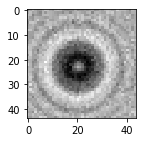

expected


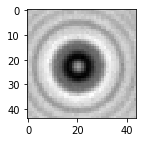

recon 


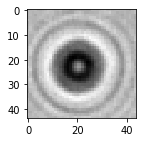

orig


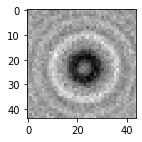

expected


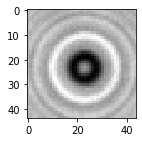

recon 


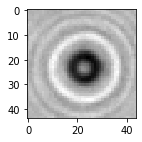

orig


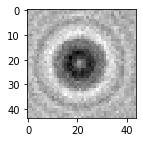

expected


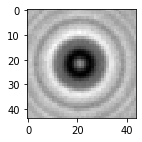

recon 


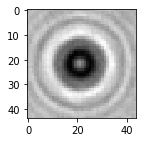

orig


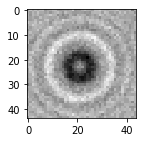

expected


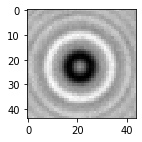

recon 


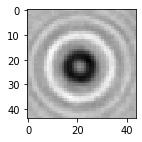

orig


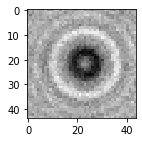

expected


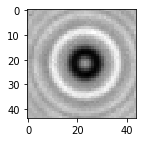

recon 


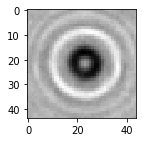

orig


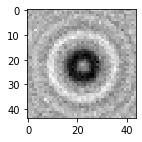

expected


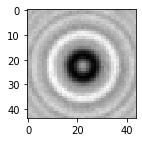

recon 


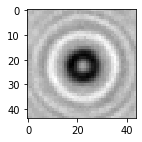

orig


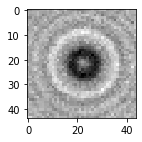

expected


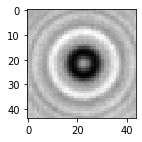

recon 


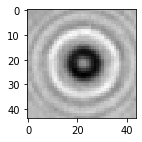

orig


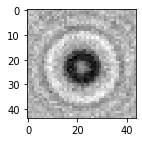

expected


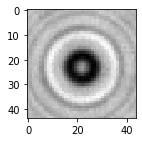

recon 


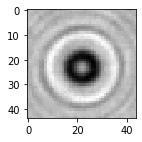

orig


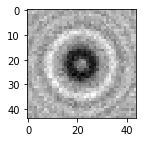

expected


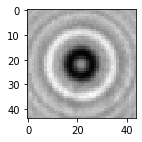

recon 


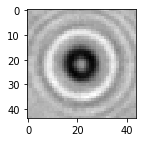

orig


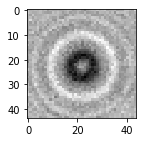

expected


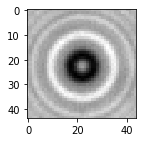

recon 


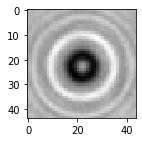

orig


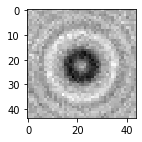

expected


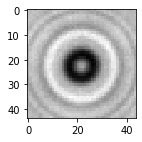

recon 


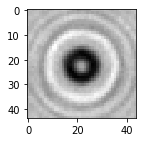

orig


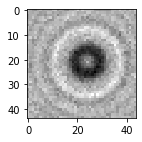

expected


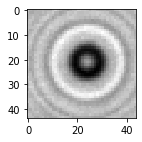

recon 


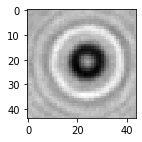

orig


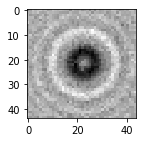

expected


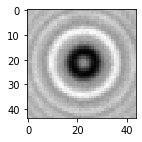

recon 


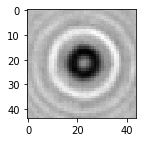

orig


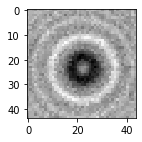

expected


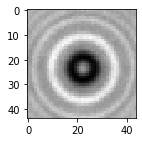

recon 


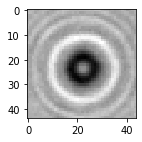

orig


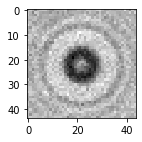

expected


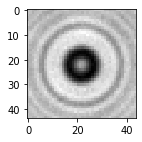

recon 


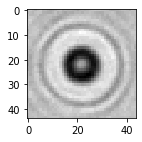

orig


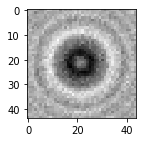

expected


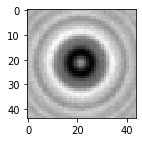

recon 


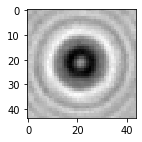

orig


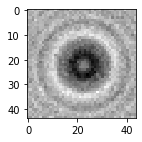

expected


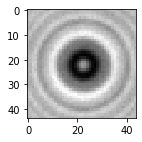

recon 


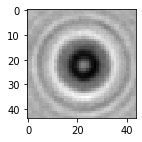

orig


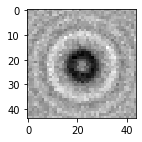

expected


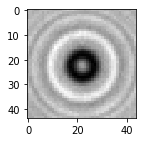

recon 


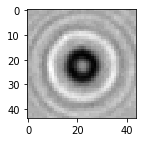

orig


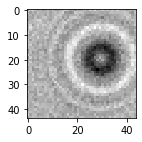

expected


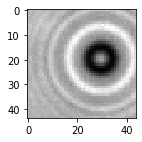

recon 


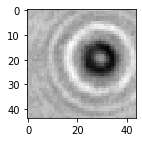

orig


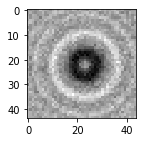

expected


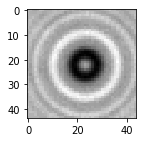

recon 


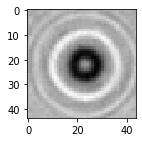

orig


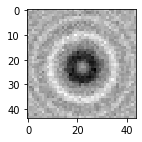

expected


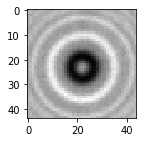

recon 


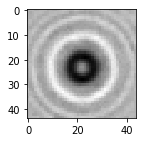

orig


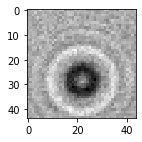

expected


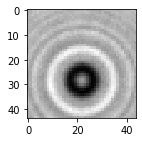

recon 


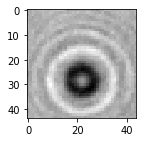

orig


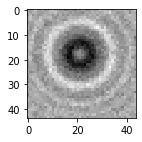

expected


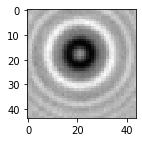

recon 


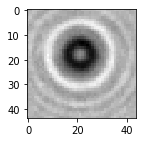

orig


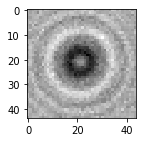

expected


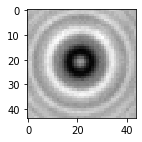

recon 


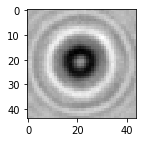

orig


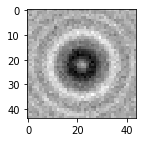

expected


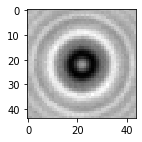

recon 


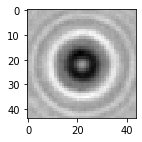

orig


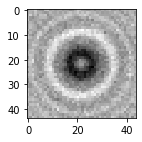

expected


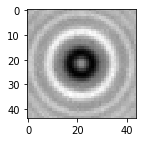

recon 


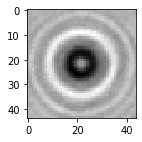

orig


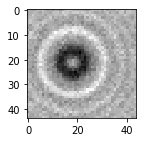

expected


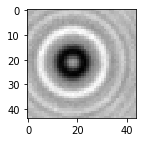

recon 


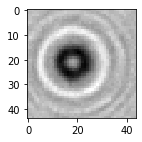

orig


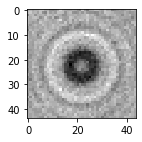

expected


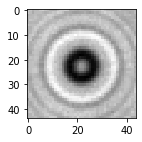

recon 


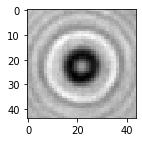

orig


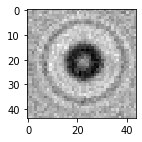

expected


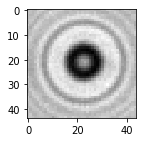

recon 


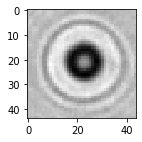

orig


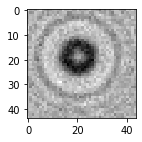

expected


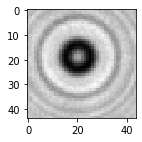

recon 


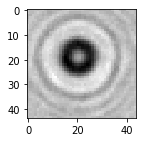

orig


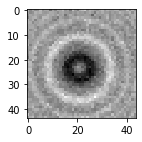

expected


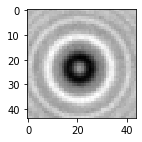

recon 


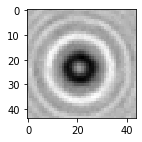

orig


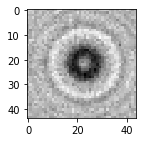

expected


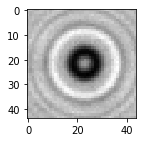

recon 


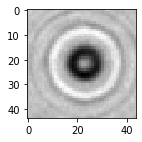

orig


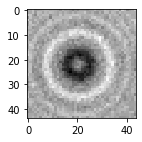

expected


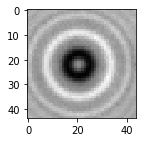

recon 


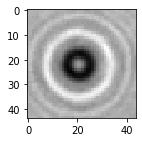

orig


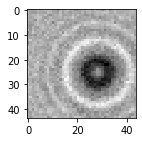

expected


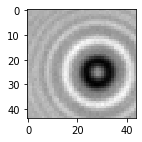

recon 


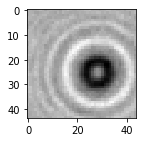

orig


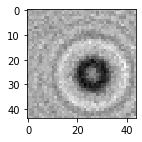

expected


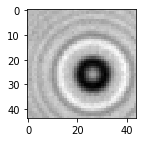

recon 


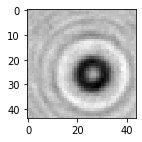

orig


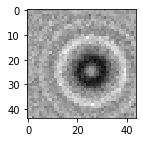

expected


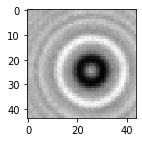

recon 


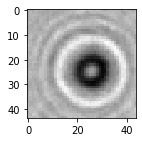

orig


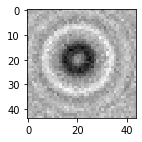

expected


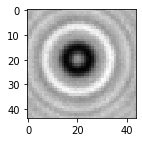

recon 


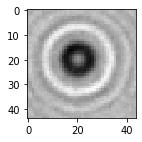

orig


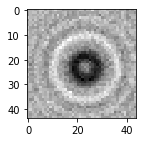

expected


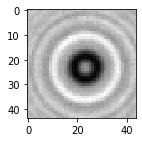

recon 


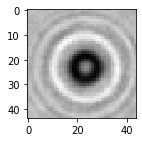

orig


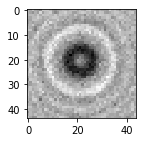

expected


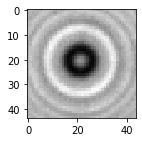

recon 


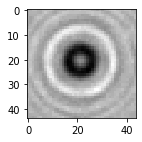

orig


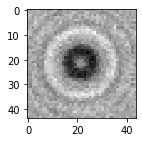

expected


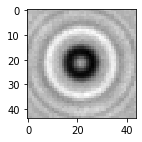

recon 


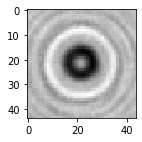

orig


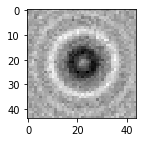

expected


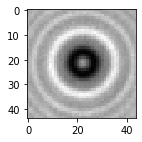

recon 


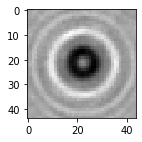

orig


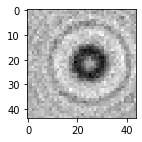

expected


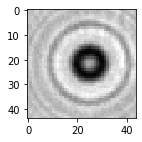

recon 


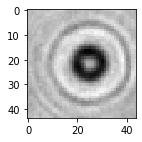

orig


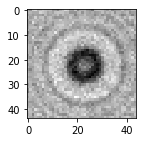

expected


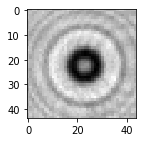

recon 


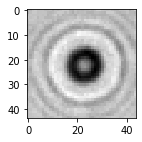

orig


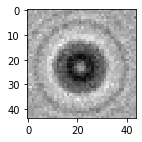

expected


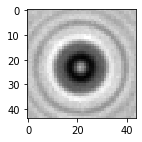

recon 


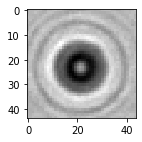

orig


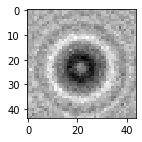

expected


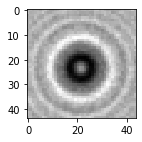

recon 


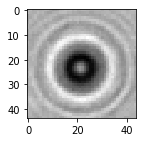

orig


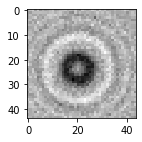

expected


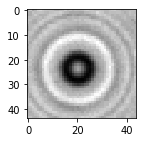

recon 


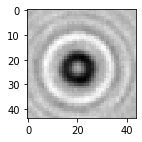

orig


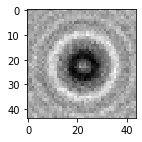

expected


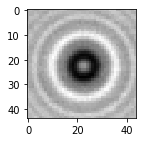

recon 


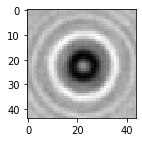

orig


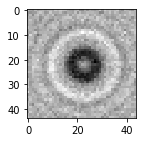

expected


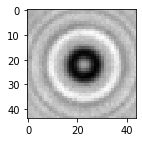

recon 


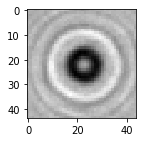

orig


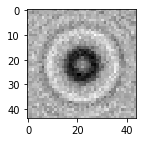

expected


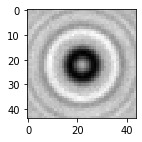

recon 


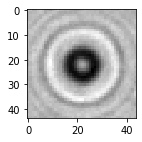

orig


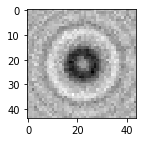

expected


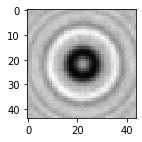

recon 


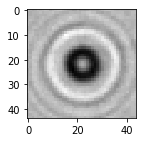

orig


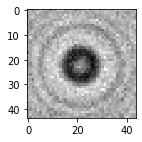

expected


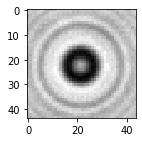

recon 


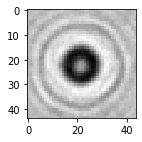

orig


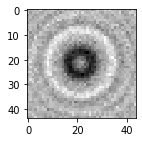

expected


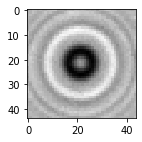

recon 


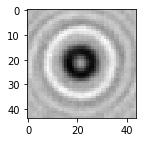

orig


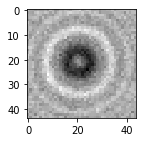

expected


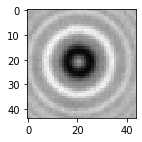

recon 


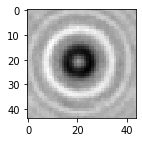

orig


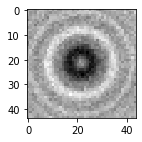

expected


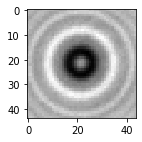

recon 


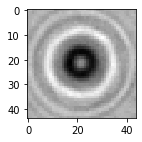

orig


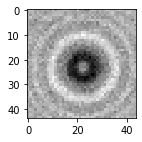

expected


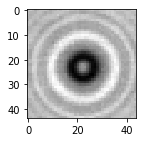

recon 


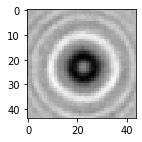

orig


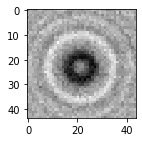

expected


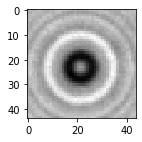

recon 


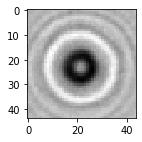

orig


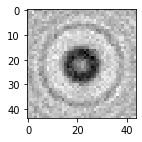

expected


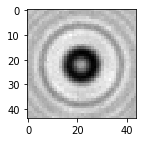

recon 


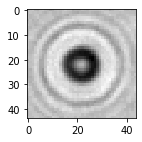

orig


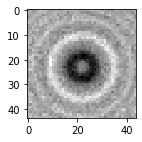

expected


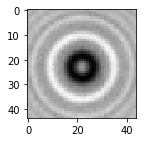

recon 


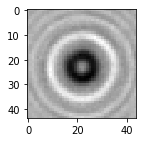

orig


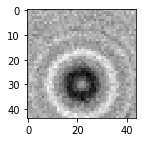

expected


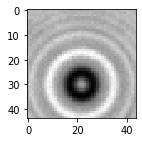

recon 


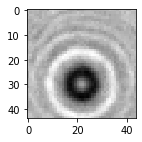

orig


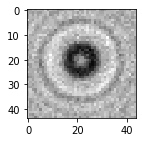

expected


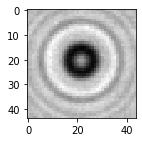

recon 


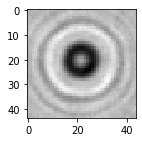

orig


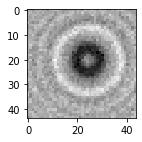

expected


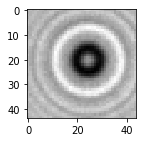

recon 


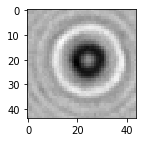

orig


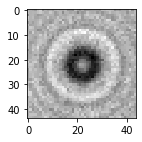

expected


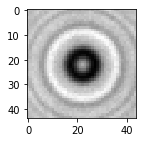

recon 


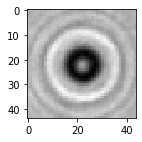

orig


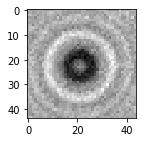

expected


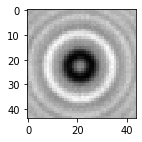

recon 


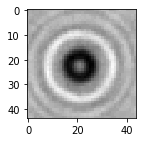

orig


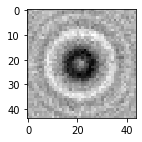

expected


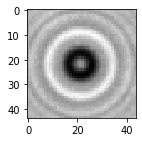

recon 


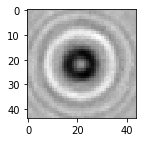

orig


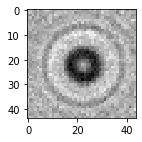

expected


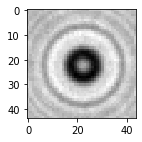

recon 


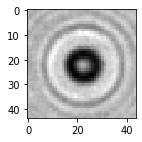

orig


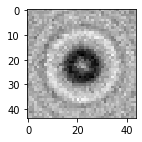

expected


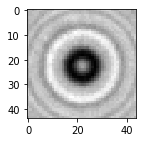

recon 


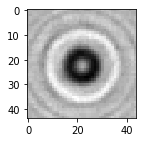

orig


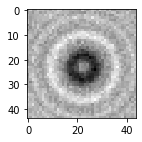

expected


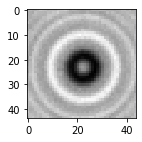

recon 


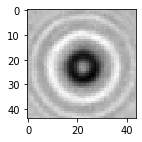

orig


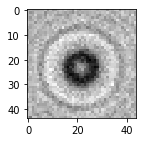

expected


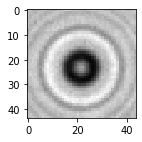

recon 


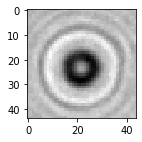

orig


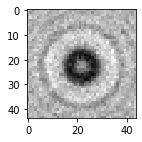

expected


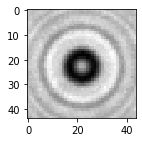

recon 


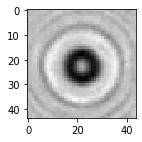

orig


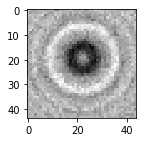

expected


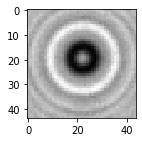

recon 


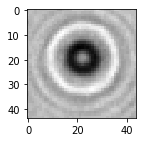

orig


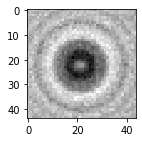

expected


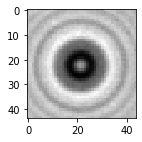

recon 


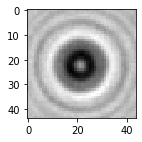

orig


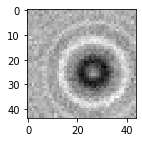

expected


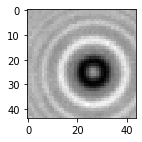

recon 


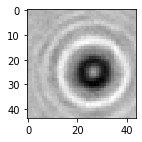

orig


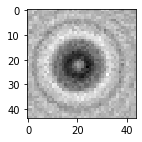

expected


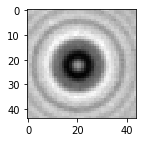

recon 


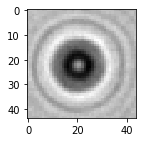

orig


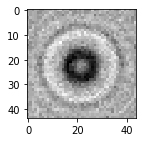

expected


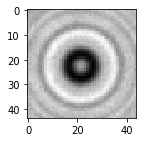

recon 


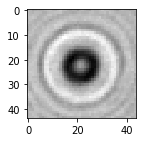

orig


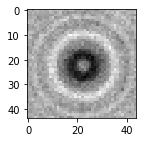

expected


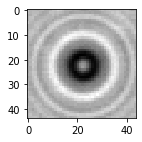

recon 


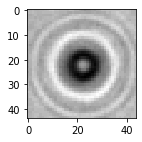

orig


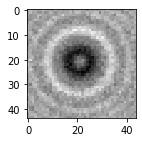

expected


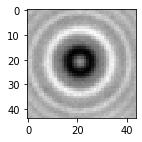

recon 


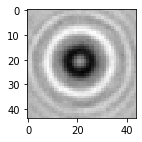

orig


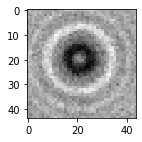

expected


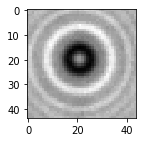

recon 


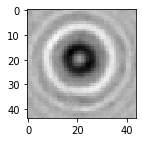

orig


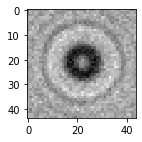

expected


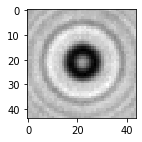

recon 


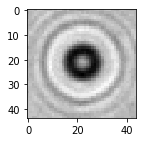

orig


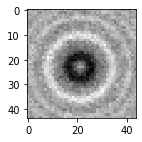

expected


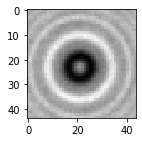

recon 


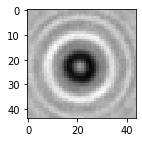

orig


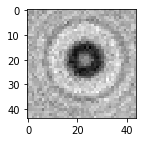

expected


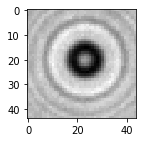

recon 


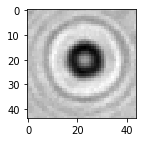

orig


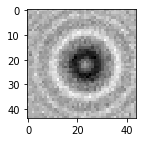

expected


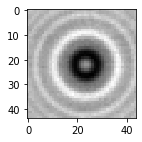

recon 


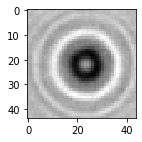

orig


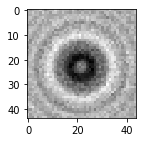

expected


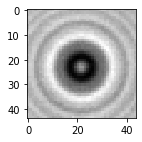

recon 


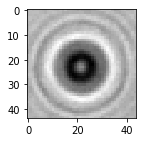

orig


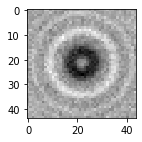

expected


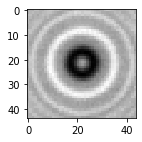

recon 


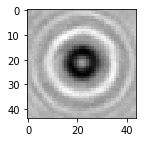

orig


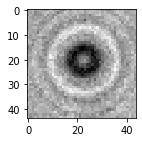

expected


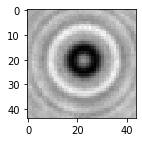

recon 


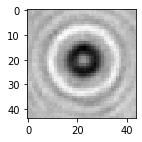

orig


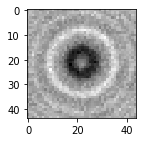

expected


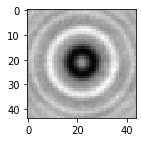

recon 


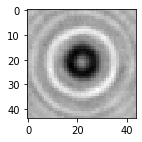

orig


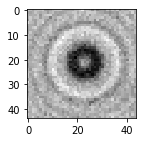

expected


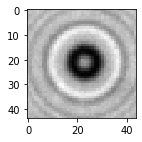

recon 


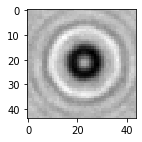

orig


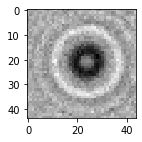

expected


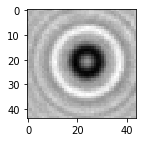

recon 


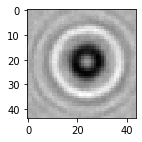

orig


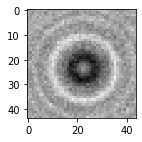

expected


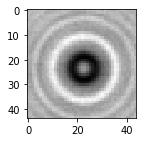

recon 


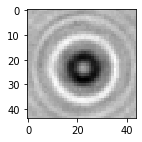

orig


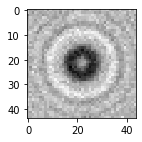

expected


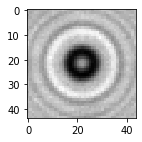

recon 


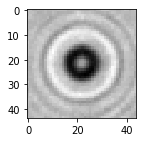

orig


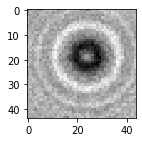

expected


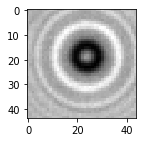

recon 


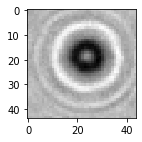

orig


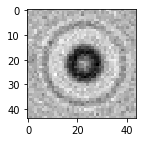

expected


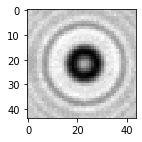

recon 


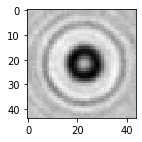

orig


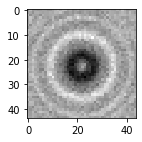

expected


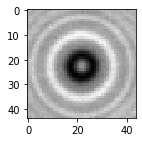

recon 


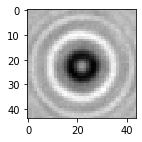

orig


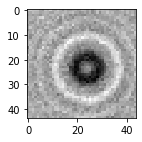

expected


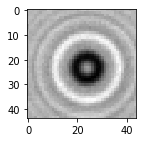

recon 


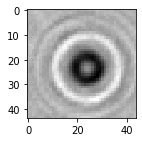

orig


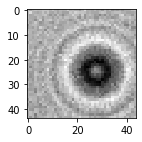

expected


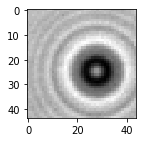

recon 


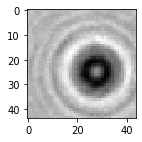

orig


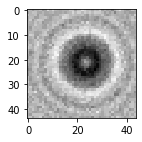

expected


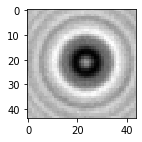

recon 


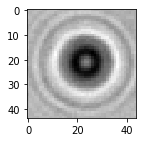

orig


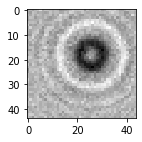

expected


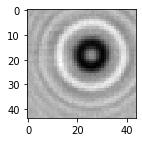

recon 


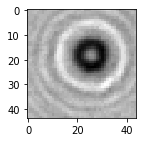

orig


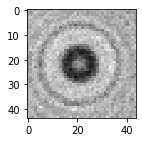

expected


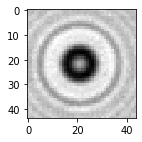

recon 


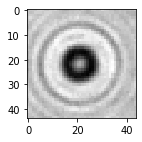

orig


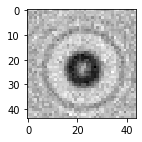

expected


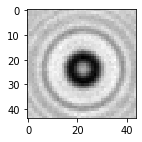

recon 


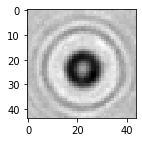

orig


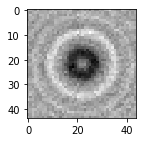

expected


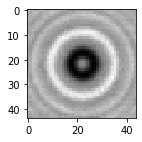

recon 


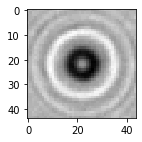

orig


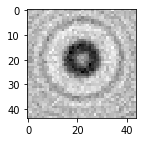

expected


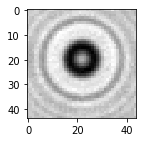

recon 


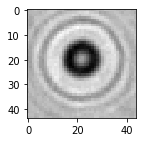

orig


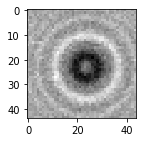

expected


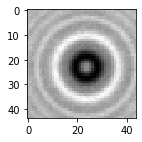

recon 


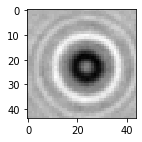

orig


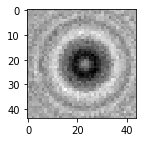

expected


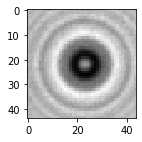

recon 


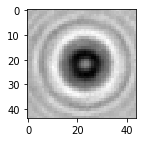

orig


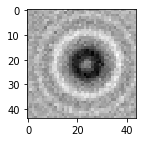

expected


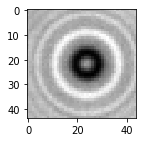

recon 


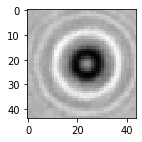

orig


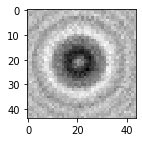

expected


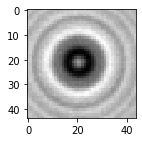

recon 


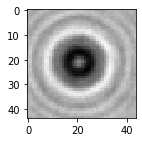

orig


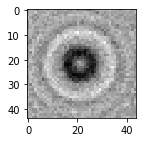

expected


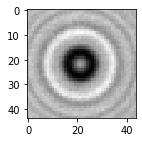

recon 


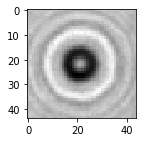

orig


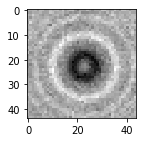

expected


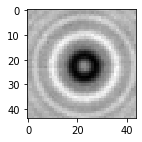

recon 


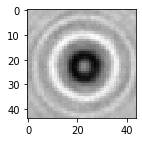

orig


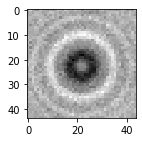

expected


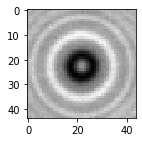

recon 


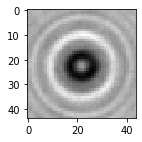

orig


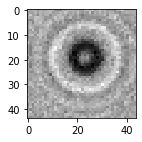

expected


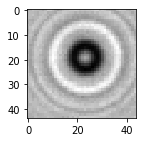

recon 


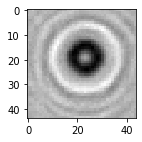

orig


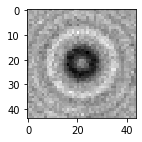

expected


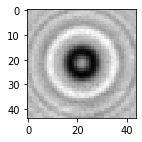

recon 


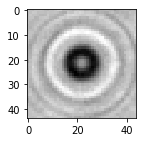

orig


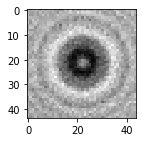

expected


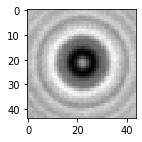

recon 


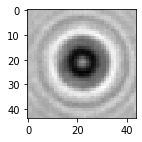

orig


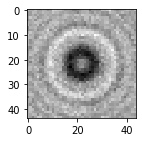

expected


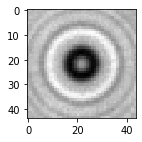

recon 


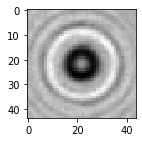

orig


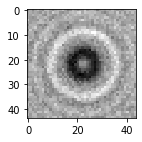

expected


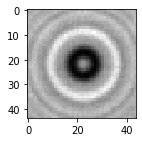

recon 


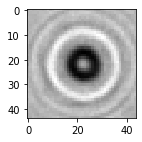

orig


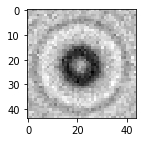

expected


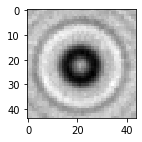

recon 


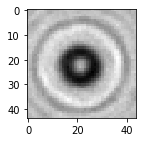

orig


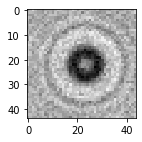

expected


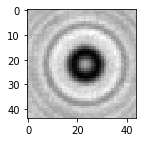

recon 


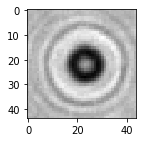

orig


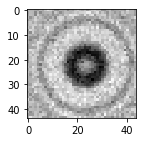

expected


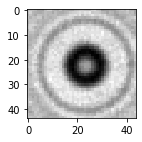

recon 


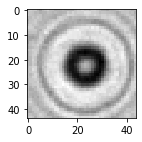

orig


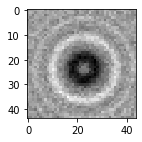

expected


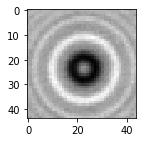

recon 


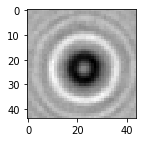

orig


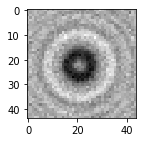

expected


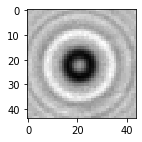

recon 


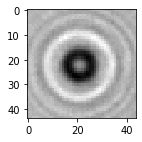

orig


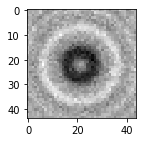

expected


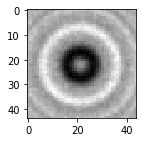

recon 


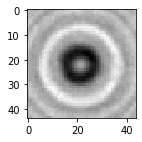

orig


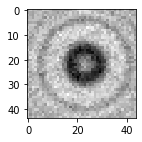

expected


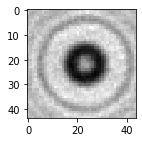

recon 


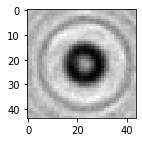

orig


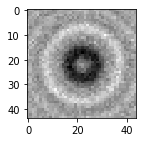

expected


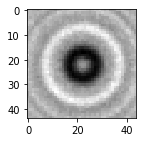

recon 


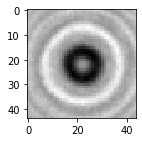

orig


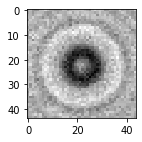

expected


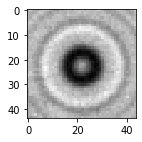

recon 


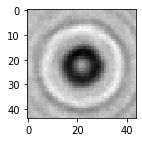

orig


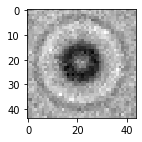

expected


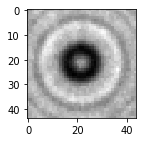

recon 


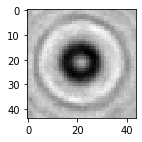

orig


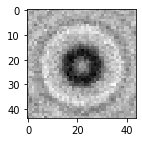

expected


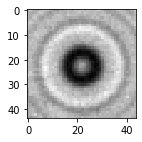

recon 


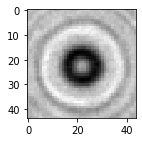

orig


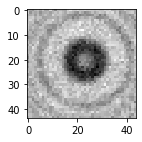

expected


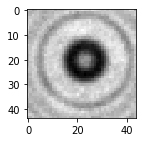

recon 


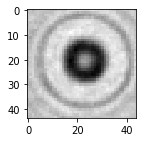

orig


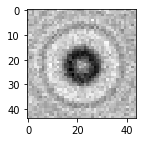

expected


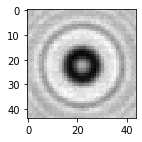

recon 


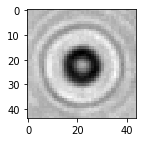

orig


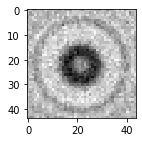

expected


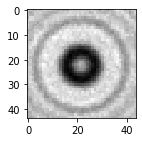

recon 


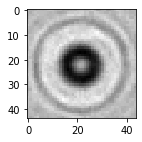

orig


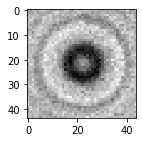

expected


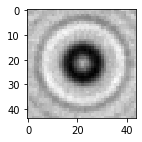

recon 


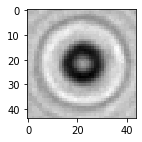

orig


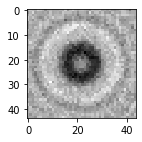

expected


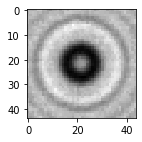

recon 


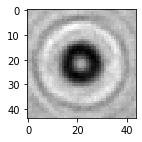

orig


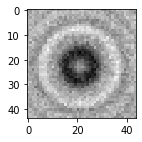

expected


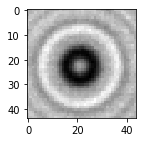

recon 


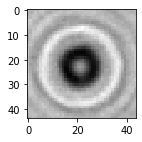

orig


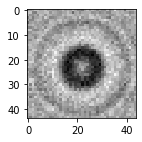

expected


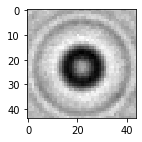

recon 


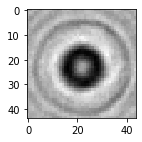

orig


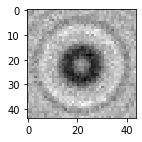

expected


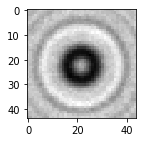

recon 


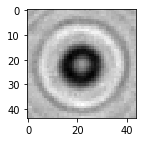

orig


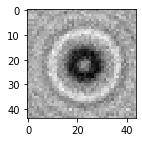

expected


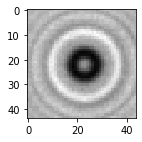

recon 


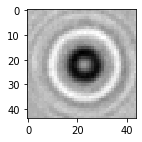

orig


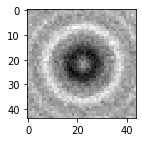

expected


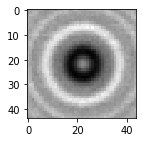

recon 


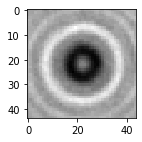

orig


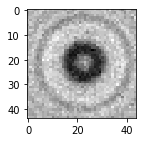

expected


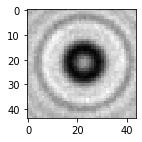

recon 


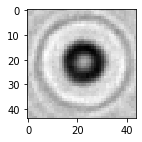

orig


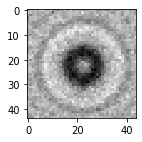

expected


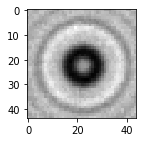

recon 


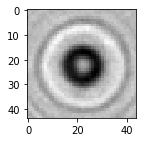

orig


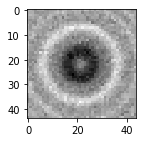

expected


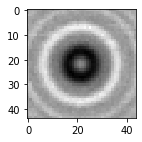

recon 


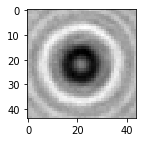

orig


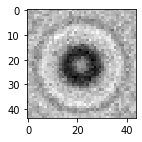

expected


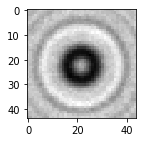

recon 


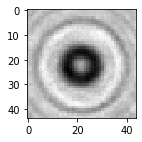

orig


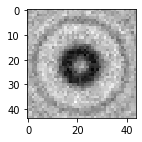

expected


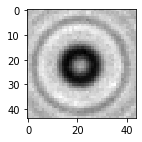

recon 


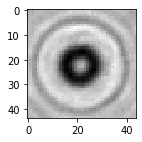

orig


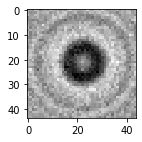

expected


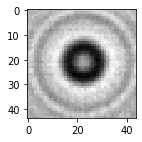

recon 


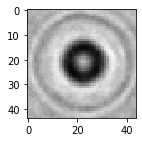

orig


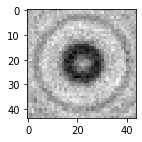

expected


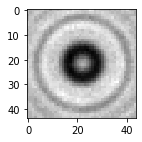

recon 


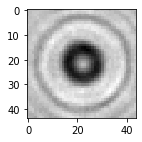

orig


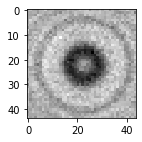

expected


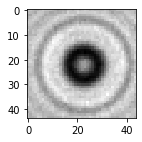

recon 


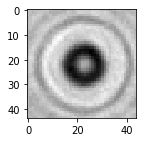

orig


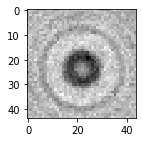

expected


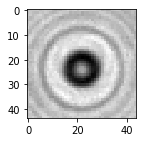

recon 


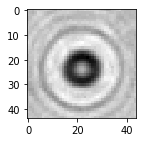

orig


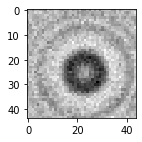

expected


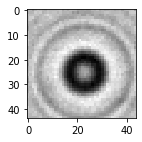

recon 


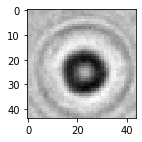

orig


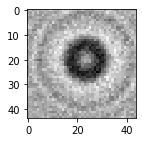

expected


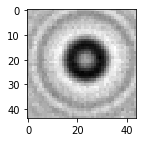

recon 


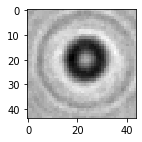

orig


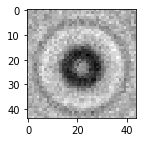

expected


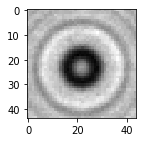

recon 


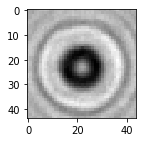

orig


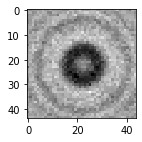

expected


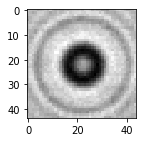

recon 


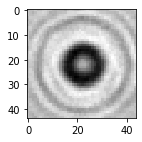

orig


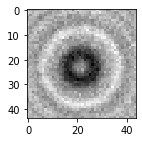

expected


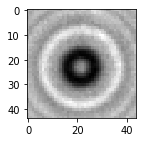

recon 


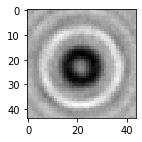

orig


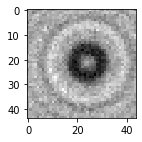

expected


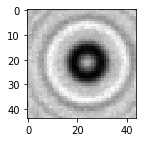

recon 


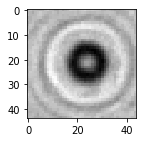

orig


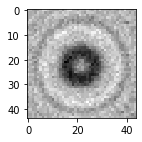

expected


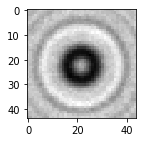

recon 


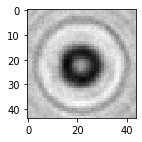

orig


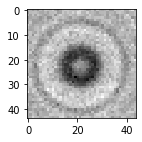

expected


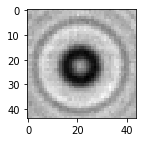

recon 


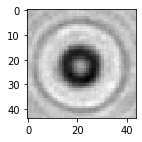

orig


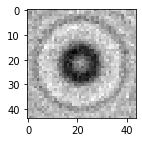

expected


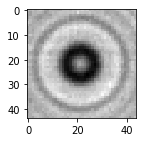

recon 


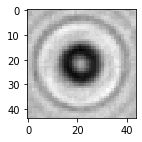

orig


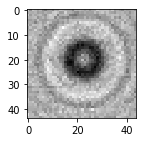

expected


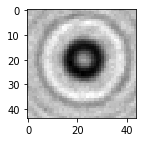

recon 


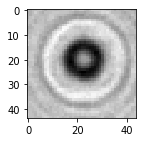

orig


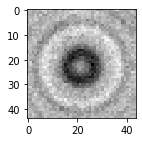

expected


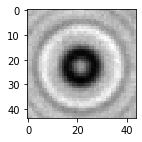

recon 


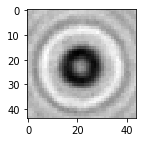

In [ ]:
trl=(glob.glob("drive/My Drive/tdata/20/*.png"))
train_images=[]
train_lis = []
x_list = []
train_lis_auginp = []
noise=[]
noise_test = []
for i in range(len(trl)):
  if(i%1==0):
    x_list.append(cv2.imread(trl[i],0)[xc:yc,xc:yc].flatten())

rng = k.shape[0]-(k.shape[0]//10)
noise_train_out = []
noise = []
noise_test_out = np.array(x_list)
noise_test = []
for j in range(noise_test_out.shape[0]):
  #print(j)
  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())
noise_test = np.array(noise_test)




import scipy
print(noise_test.shape)
#x_test=np.true_divide(noise_test,255)
#print(x_test.shape)
recon = []
for j in range(noise_test.shape[0]):

  y1=np.matmul(w1,noise_test[j])
  #print("y1-",y1)
  theta1=relu(y1)
  #print("theta3-",theta3)
  out=np.matmul(w2,theta1)
  #print(out)
  theta2=relu(out)
  recon.append(theta2)
            
  if(j%1==0):
    print("orig")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test[j],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmnsy/elmnsy"+str(j)+".png",np.resize(noise_test[j],(44,44)),cmap='gray')
    plt.show()
    print("expected")
    #plt.figure(figsize=(3,3))
    #plt.imshow(np.resize(np.multiply(noise_test_out[j],255),(44,44)), origin="upper",cmap="gray")
    #plt.show()
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(noise_test_out[j],(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elminp/elminp"+str(j)+".png",np.resize(noise_test_out[j],(44,44)),cmap='gray')
    plt.show()
    #cv2_imshow(np.resize(np.multiply(noise_test[j],255),(44,44)))
    print("recon ")
    #cv2_imshow(np.resize(np.multiply(theta2,255),(44,44)))
    plt.figure(figsize=(2,2))
    plt.imshow(np.resize(np.multiply(theta2,255),(sz,sz)),cmap="gray")
    #plt.imsave("drive/My Drive/elmop/elmop"+str(j)+".png",np.resize(np.multiply(theta2,255),(44,44)),cmap='gray')
    plt.show()

In [ ]:
aa = []
bb = []
cc = []
for lk in range(noise_test_out.shape[0]):
  a = noise_test_out[lk]
  a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
  aa.append(a)
  b = noise_test[lk]
  b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
  bb.append(b)
  c = recon[lk]
  #c = np.true_divide(recon,255)
  c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
  cc.append(c)
aa = np.array(aa)
bb = np.array(bb)
cc = np.array(cc)
print(np.amax(bb))

import math
import matplotlib.pyplot as pypt
def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[22][:]
        l = noisar[22][:]
        m = reconar[22][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar
snratio = []
snrinar = []
snroutar =  []
snratio,snrinar,snroutar = snr5(aa,bb,cc)
print("SNR 5")
print(snratio)
print(snrinar)
print(snroutar)
print(np.mean(snratio))
print(np.mean(snrinar))
print(np.mean(snroutar))

1.0
SNR 5
[7.824948243780096, 3.611632715298505, 7.935034486237658, 2.9153653559814217, 5.21914115078723, 3.1092733474282674, 4.496838403009711, 1.0223739475891378, -1.4669095343810916, 6.538764156625334, 1.9065801781339289, 3.6867194747373624, 2.245962175917743, 4.718236727849341, 3.655350682352676, 4.099580341228517, 8.798867888423505, 7.749587783034887, 6.777513745752838, 5.411143566994767, 4.03656355497899, 7.447196485992372, 2.0717677727916985, 4.572190891871159, 5.518683091315488, 4.842648221309101, 7.132857131054482, 5.0790589873055545, 5.757881692858856, 3.904602043000743, 4.704164642863191, 4.074095250738793, 2.557446913829594, 3.577951125596904, 4.693363043141318, 6.011146471924199, 6.7835275655110685, 4.735843780544698, 2.9690379562909115, 8.959864675378842, 8.315379314680893, 6.48074292527852, 4.936197217052602, 4.206169513452615, 6.836026803569961, 7.41012649406591, 7.161514415559054, 6.338085598234155, 4.9814291361522365, 5.92062392557326, 4.047674420716053, 9.04744928208

### Autoencoder using CNN

In [ ]:
#fetch images
#user should change the path to their input
# change xc and yc to change the dimension of images wherexc and yc are coordinates and sz is pixels along one dimension 
sz=50
xc=8
yc=58
input_nodes=sz*sz
hidden_nodes=2500
output_nodes =sz*sz
train_x_list=[]
train_x_list=glob.glob("drive/My Drive/tdata/rbc/*.png")
train_x_list.extend(glob.glob("drive/My Drive/tdata/HepG2/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/MCF7/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/10/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/20/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd4/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd8/*.png"))
#random.shuffle(train_x_list)
print(train_x_list)
train_images=[]
train_lis = []
x_list = []
train_lis_auginp = []
noise=[]
noise_test = []
for i in range(len(train_x_list)):
  
  if(i%50==0):
    x_list.append(cv2.imread(train_x_list[i],0)[xc:yc,xc:yc].flatten())
  else:
    a = cv2.imread(train_x_list[i],0)
    if(train_x_list[i].split('/')[3]=='HepG2' or train_x_list[i].split('/')[3]=='MCF7'):
        train_images.append(a[xc:yc,xc:yc].flatten())
        train_images.append(np.fliplr(a[xc:yc,xc:yc]).flatten())
        train_images.append(np.fliplr(a[xc:yc,xc:yc]).flatten())
        train_lis_auginp.append(np.fliplr(a[xc:yc,xc:yc]))
        train_lis_auginp.append(np.flipud(a[xc:yc,xc:yc]))
        train_lis_auginp.append(a[xc:yc,xc:yc])

    else:
      train_lis_auginp.append(a[xc:yc,xc:yc])
      train_images.append(a[xc:yc,xc:yc].flatten())
    #noise.append(noisy(cv2.imread(train_x_list[i],0))[11:55,11:55].flatten())
    #cv2_imshow(np.resize(noise[i],(44,44)))
#saving input list before conv to np array
train_lis = train_images
train_images=np.array(train_images)
print(train_images.shape)


['drive/My Drive/tdata/rbc/5 (315).png', 'drive/My Drive/tdata/rbc/5 (301).png', 'drive/My Drive/tdata/rbc/5 (306).png', 'drive/My Drive/tdata/rbc/5 (310).png', 'drive/My Drive/tdata/rbc/5 (31).png', 'drive/My Drive/tdata/rbc/5 (305).png', 'drive/My Drive/tdata/rbc/5 (316).png', 'drive/My Drive/tdata/rbc/5 (314).png', 'drive/My Drive/tdata/rbc/5 (313).png', 'drive/My Drive/tdata/rbc/5 (309).png', 'drive/My Drive/tdata/rbc/5 (312).png', 'drive/My Drive/tdata/rbc/5 (317).png', 'drive/My Drive/tdata/rbc/5 (318).png', 'drive/My Drive/tdata/rbc/5 (311).png', 'drive/My Drive/tdata/rbc/5 (35).png', 'drive/My Drive/tdata/rbc/5 (32).png', 'drive/My Drive/tdata/rbc/5 (36).png', 'drive/My Drive/tdata/rbc/5 (38).png', 'drive/My Drive/tdata/rbc/5 (56) (1).png', 'drive/My Drive/tdata/rbc/5 (320).png', 'drive/My Drive/tdata/rbc/5 (319).png', 'drive/My Drive/tdata/rbc/5 (52) (1).png', 'drive/My Drive/tdata/rbc/5 (64).png', 'drive/My Drive/tdata/rbc/5 (6).png', 'drive/My Drive/tdata/rbc/5 (60).png', 'd

In [ ]:
def rotate_image(image, angle ):
    img_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(img_center, angle, 1.0)
    rotated = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return rotated
def img_augmentor(image):
  res= []
  for angle in np.arange(0, 360, 15):
    #background mask
    bgmask=np.zeros((image.shape[:2]), np.uint8)
    cv2.circle(bgmask, ( int(bgmask.shape[0]/2), int(bgmask.shape[1]/2) ), 32, (255), -1)
    #cell mask
    cellmask=cv2.bitwise_not(bgmask)
    #cell background
    bg = cv2.bitwise_or(image, image, mask=cellmask)
    #rotate img
    rotated=rotate_image(image, angle)
    #cell cropping
    cell= cv2.bitwise_or(rotated, rotated, mask=bgmask)
    final = cv2.bitwise_or(bg, cell)
    #cv2_imshow(final)
    final = np.array(final)
    res.append(final)
  return res
    #disp
    #cv.imshow("final mask", final)
    #cv.waitKey(0)
    
    #save rotated image on pc
    #cv.imwrite("imgrot"+str(angle)+".png", final)
    
    #save flattened img into csv
    #finalflat= final.flatten()/255.0
    #write this to excel
    
    #cv.destroyAllWindows()
def canaug(img):
  img = np.array(img)
  img = img.reshape((50,50))
  final_train_data = []
  final_train_data.append(img)
  final_train_data.append(np.fliplr(img))
  final_train_data.append(np.flipud(img))
  for i in range(1,12):
    for j in range(3):
      final_train_data.append(rotate(final_train_data[j], angle=i, mode = 'edge'))
      final_train_data.append(rotate(final_train_data[j], angle=360-i, mode = 'edge'))
    if(i==11):
      cv2_imshow(final_train_data[-1])
  return final_train_data    

In [ ]:
sz=50
xc=8
yc=58
input_nodes=sz*sz
hidden_nodes=2700
output_nodes =sz*sz
train_x_list=glob.glob("drive/My Drive/tdata/rbc/*.png")
train_x_list.extend(glob.glob("drive/My Drive/tdata/HepG2/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/MCF7/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/10/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/20/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd4/*.png"))
train_x_list.extend(glob.glob("drive/My Drive/tdata/cd8/*.png"))
#random.shuffle(train_x_list)
print(train_x_list)
train_images=[]
train_lis = []
x_list = []
train_lis_auginp = []
noise=[]
noise_test = []
file_name=[]
for i in range(len(train_x_list)):
  if(i%30==0):
    file_name.append(train_x_list[i])
    x_list.append(cv2.imread(train_x_list[i],0)[xc:yc,xc:yc].flatten())
  else:
    a = cv2.imread(train_x_list[i],0)
    if(train_x_list[i].split('/')[3]=='HepG2' or train_x_list[i].split('/')[3]=='MCF7'):
      for ag in img_augmentor(a):
        #train_lis_auginp.append(ag[xc:yc,xc:yc])
        train_images.append(ag[xc:yc,xc:yc].flatten())
    else:
      train_lis_auginp.append(a[xc:yc,xc:yc])
      train_images.append(a[xc:yc,xc:yc].flatten())
    #noise.append(noisy(cv2.imread(train_x_list[i],0))[11:55,11:55].flatten())
    #cv2_imshow(np.resize(noise[i],(44,44)))
#saving input list before conv to np array
train_lis = train_images
train_images=np.array(train_images)
#x_list contains test images and train_lis contains train images
print(train_images.shape)

print(train_images)

['drive/My Drive/tdata/rbc/5 (315).png', 'drive/My Drive/tdata/rbc/5 (301).png', 'drive/My Drive/tdata/rbc/5 (306).png', 'drive/My Drive/tdata/rbc/5 (310).png', 'drive/My Drive/tdata/rbc/5 (31).png', 'drive/My Drive/tdata/rbc/5 (305).png', 'drive/My Drive/tdata/rbc/5 (316).png', 'drive/My Drive/tdata/rbc/5 (314).png', 'drive/My Drive/tdata/rbc/5 (313).png', 'drive/My Drive/tdata/rbc/5 (309).png', 'drive/My Drive/tdata/rbc/5 (312).png', 'drive/My Drive/tdata/rbc/5 (317).png', 'drive/My Drive/tdata/rbc/5 (318).png', 'drive/My Drive/tdata/rbc/5 (311).png', 'drive/My Drive/tdata/rbc/5 (35).png', 'drive/My Drive/tdata/rbc/5 (32).png', 'drive/My Drive/tdata/rbc/5 (36).png', 'drive/My Drive/tdata/rbc/5 (38).png', 'drive/My Drive/tdata/rbc/5 (56) (1).png', 'drive/My Drive/tdata/rbc/5 (320).png', 'drive/My Drive/tdata/rbc/5 (319).png', 'drive/My Drive/tdata/rbc/5 (52) (1).png', 'drive/My Drive/tdata/rbc/5 (64).png', 'drive/My Drive/tdata/rbc/5 (6).png', 'drive/My Drive/tdata/rbc/5 (60).png', 'd

In [ ]:
train_lis_auginp = np.array(train_lis_auginp)
print(train_lis_auginp.shape)
train_lis_auginp = np.reshape(train_lis_auginp,(train_lis_auginp.shape[0],train_lis_auginp.shape[1],train_lis_auginp.shape[2],1))

(1306, 50, 50)


In [ ]:
file_name

['drive/My Drive/tdata/rbc/5 (315).png',
 'drive/My Drive/tdata/rbc/5 (34).png',
 'drive/My Drive/tdata/rbc/5 (50).png',
 'drive/My Drive/tdata/rbc/5 (75).png',
 'drive/My Drive/tdata/rbc/5 (101).png',
 'drive/My Drive/tdata/rbc/5 (137).png',
 'drive/My Drive/tdata/rbc/5 (163).png',
 'drive/My Drive/tdata/rbc/5 (186).png',
 'drive/My Drive/tdata/rbc/5 (216).png',
 'drive/My Drive/tdata/rbc/5 (239).png',
 'drive/My Drive/tdata/rbc/5 (265).png',
 'drive/My Drive/tdata/HepG2/3 (1).png',
 'drive/My Drive/tdata/HepG2/3 (41).png',
 'drive/My Drive/tdata/HepG2/3 (9).png',
 'drive/My Drive/tdata/MCF7/4 (40).png',
 'drive/My Drive/tdata/10/1 (102).png',
 'drive/My Drive/tdata/10/1 (134).png',
 'drive/My Drive/tdata/10/1 (160).png',
 'drive/My Drive/tdata/10/1 (184).png',
 'drive/My Drive/tdata/10/1 (37).png',
 'drive/My Drive/tdata/10/1 (68).png',
 'drive/My Drive/tdata/10/1 (98).png',
 'drive/My Drive/tdata/20/2 (122).png',
 'drive/My Drive/tdata/20/2 (150).png',
 'drive/My Drive/tdata/20/2 (1

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
k = 0
datagen = ImageDataGenerator(rotation_range=90)
it = datagen.flow(train_lis_auginp, batch_size=1)
datagen2 = ImageDataGenerator(rotation_range=180)
it2 = datagen2.flow(train_lis_auginp, batch_size=1)
datagen3 = ImageDataGenerator(rotation_range=270)
it3 = datagen3.flow(train_lis_auginp, batch_size=1)
for i in range(train_lis_auginp.shape[0]):
  img = it.next()
  img = img.flatten()
  train_lis.append(img)
  img = it2.next()
  img = img.flatten()
  train_lis.append(img)
  img = it3.next()
  img = img.flatten()
  train_lis.append(img)
random.shuffle(train_lis)
k = np.array(train_lis)
print(k.shape)

(7912, 2500)


In [ ]:
#final array is k
#% of training set
rng = k.shape[0]-(k.shape[0]//10)
noise_train_out = []
print(rng)
noise = []
#train_final = k[:rng]
#test_final = k[rng:]
for i in range(k.shape[0]):
  noise.append(noisy(np.reshape(train_lis[i],(sz,sz))).flatten())
  #cv2_imshow(np.resize(noise[i],(44,44)))
noise_train = np.array(noise)
#noise_train = noise_train[:rng]
#noise_test = noise_train[rng:]
#noise_train_out = k[:rng]
#noist_test_out = k[rng:]
noise_trai = noise_train
#noise_test = noise_train[2001:2010]
noise_train_out = k
#noist_test_out = k[2001:2010]
noise_test_out = np.array(x_list)
print(noise_test_out.shape[0])
noise_test = []
for j in range(noise_test_out.shape[0]):
  #print(j)
  noise_test.append(noisy(np.reshape(noise_test_out[j],(sz,sz))).flatten())
noise_test = np.array(noise_test)
print(np.amax(noise_test))
print(np.amax(noise_test_out))
print(np.amin(noise_test_out))
print(noise_test.shape)

7121
49
276.58262626569456
255
15
(49, 2500)


In [ ]:
from keras.datasets import mnist
import numpy as np
from keras.layers import Input, Dense
from keras.models import Model
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K
from keras.callbacks import TensorBoard
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import matplotlib.pyplot as plt
from keras.callbacks import Callback

class Histories(Callback):

    def on_train_begin(self,logs={}):
        self.losses = []
    def on_batch_end(self, batch, logs={}):
        self.losses[-1].append(logs.get('loss'))
    def on_epoch_begin(self, epoch, logs={}):
        self.losses.append([])

histories = Histories()



model4 = Sequential()
inp=(sz,sz,1)
model4.add(Conv2D(16, (3, 3), input_shape=inp,padding="same"))
model4.add(Activation('relu'))
#model4.add(MaxPooling2D(pool_size=(2, 2),padding="same"))
model4.add(Conv2D(16, (3, 3),padding="same"))
model4.add(Activation('relu'))
#model4.add(MaxPooling2D(pool_size=(2, 2),padding="same"))
model4.add(Conv2D(32, (5, 5),padding="same"))
model4.add(Activation('relu'))
model4.add(Conv2D(32, (5, 5),padding="same"))
model4.add(Activation('relu'))
#model4.add(MaxPooling2D(pool_size=(2, 2),padding="same"))
model4.add(Conv2D(64, (7, 7),padding="same"))
model4.add(Activation('relu'))
#model4.add(MaxPooling2D(pool_size=(2, 2),padding="same"))
model4.add(Conv2D(64, (7, 7),padding="same"))
model4.add(Activation('relu'))
#model4.add(UpSampling2D())
model4.add(Conv2D(1, (1, 1),padding="same"))
model4.summary()
model4.compile(optimizer='adam', loss='mean_squared_error',metrics=['accuracy'])

model4.fit(np.reshape(noise_trai, (len(noise_trai), sz, sz,1)),np.reshape(noise_train_out, (len(noise_train_out), sz, sz,1)),
                epochs=5,
                batch_size=1,
                shuffle=True,callbacks=[histories])
img=model4.predict(np.reshape(noise_test*255, (len(noise_test), sz, sz,1)))
#print(len(history))



Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_358 (Conv2D)          (None, 50, 50, 16)        160       
_________________________________________________________________
activation_309 (Activation)  (None, 50, 50, 16)        0         
_________________________________________________________________
conv2d_359 (Conv2D)          (None, 50, 50, 16)        2320      
_________________________________________________________________
activation_310 (Activation)  (None, 50, 50, 16)        0         
_________________________________________________________________
conv2d_360 (Conv2D)          (None, 50, 50, 32)        12832     
_________________________________________________________________
activation_311 (Activation)  (None, 50, 50, 32)        0         
_________________________________________________________________
conv2d_361 (Conv2D)          (None, 50, 50, 32)      

orig
nsy
rec


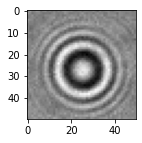

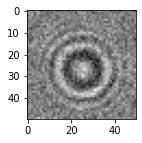

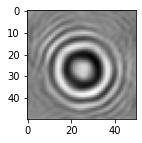

orig
nsy
rec


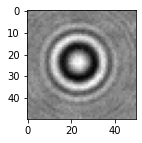

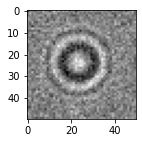

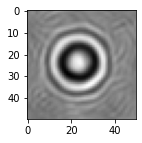

orig
nsy
rec


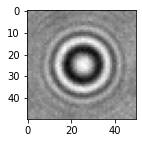

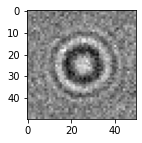

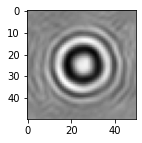

orig
nsy
rec


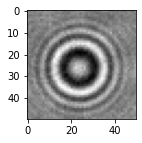

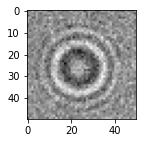

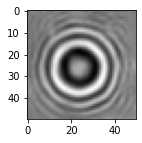

orig
nsy
rec


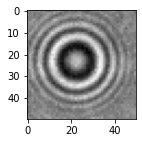

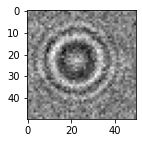

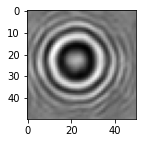

orig
nsy
rec


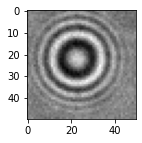

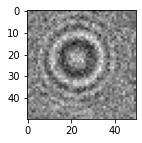

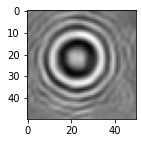

orig
nsy
rec


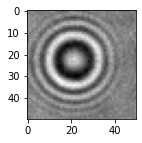

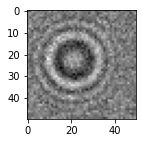

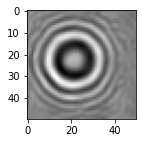

orig
nsy
rec


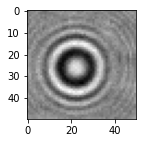

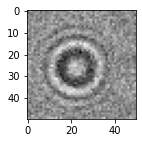

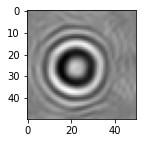

orig
nsy
rec


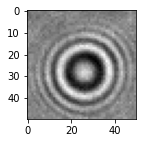

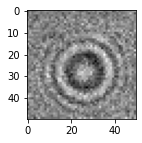

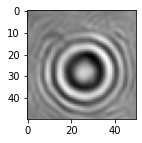

orig
nsy
rec


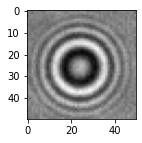

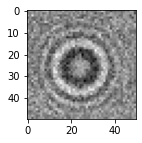

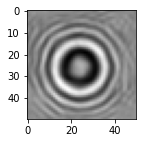

orig
nsy
rec


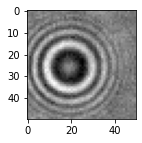

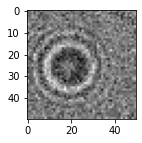

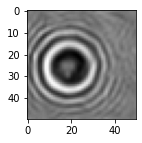

orig
nsy
rec


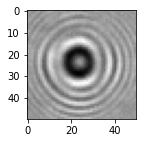

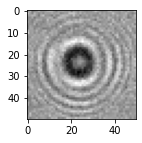

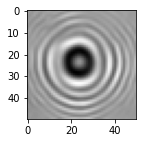

orig
nsy
rec


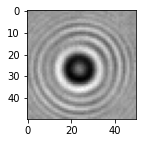

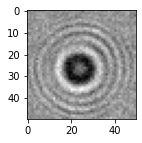

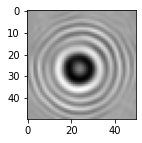

orig
nsy
rec


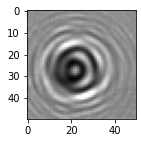

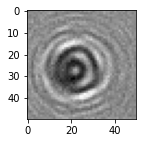

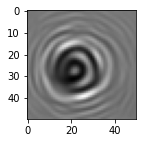

orig
nsy
rec


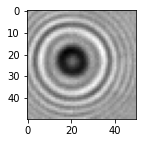

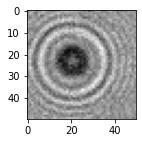

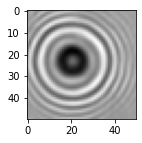

orig
nsy
rec


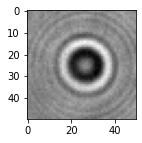

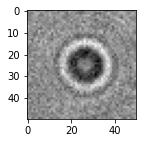

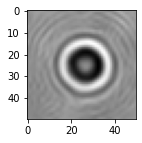

orig
nsy
rec


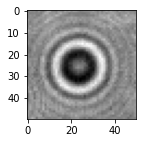

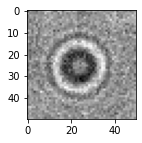

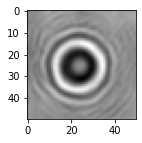

orig
nsy
rec


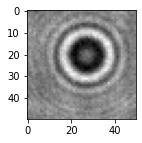

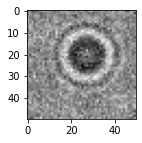

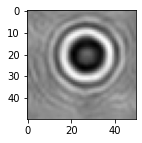

orig
nsy
rec


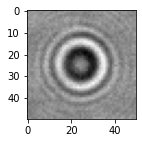

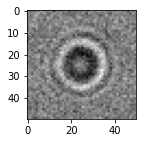

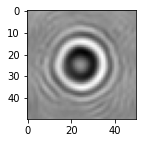

orig
nsy
rec


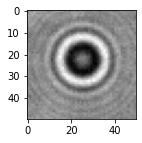

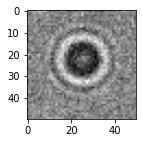

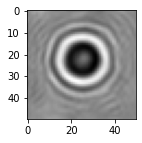

orig
nsy
rec


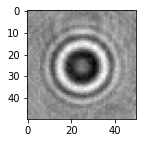

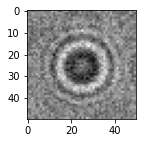

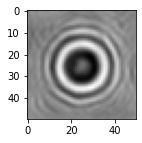

orig
nsy
rec


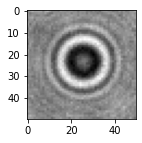

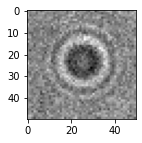

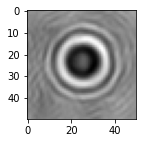

orig
nsy
rec


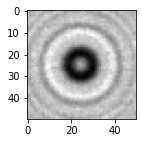

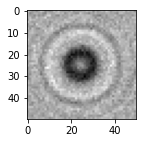

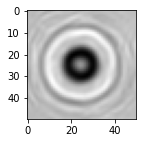

orig
nsy
rec


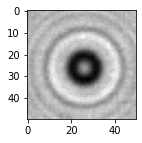

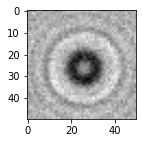

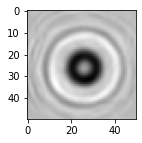

orig
nsy
rec


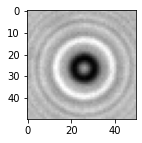

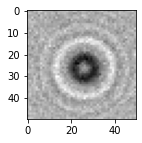

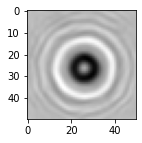

orig
nsy
rec


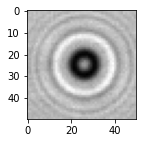

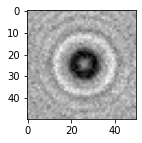

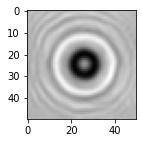

orig
nsy
rec


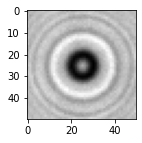

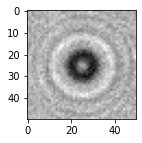

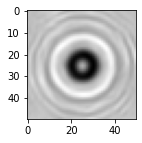

orig
nsy
rec


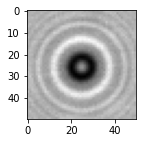

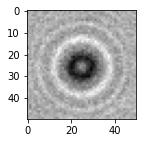

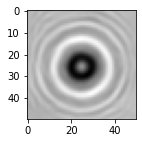

orig
nsy
rec


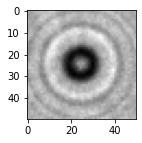

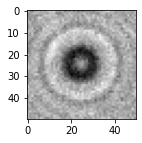

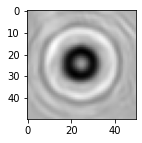

orig
nsy
rec


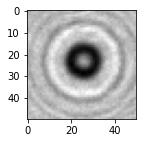

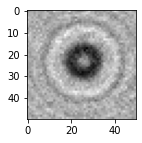

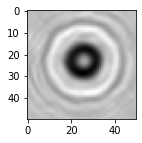

orig
nsy
rec


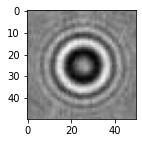

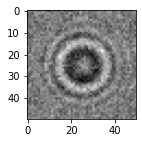

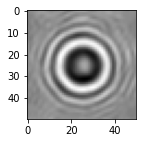

orig
nsy
rec


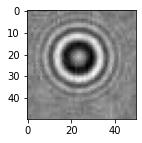

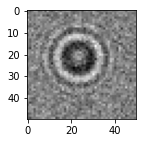

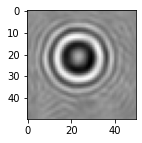

orig
nsy
rec


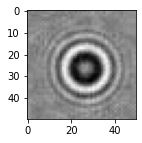

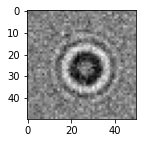

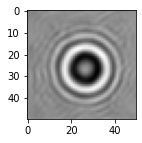

orig
nsy
rec


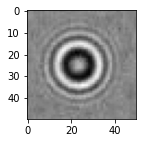

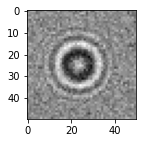

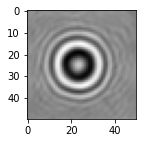

orig
nsy
rec


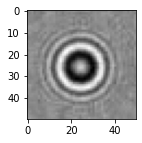

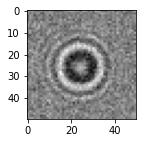

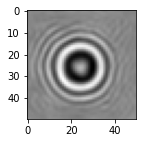

orig
nsy
rec


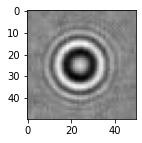

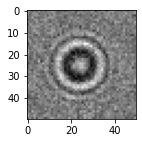

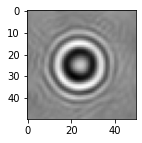

orig
nsy
rec


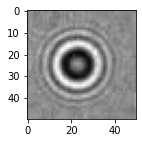

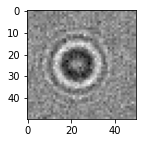

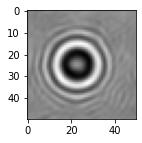

orig
nsy
rec


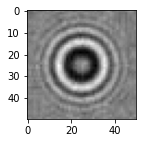

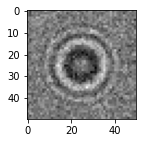

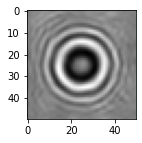

orig
nsy
rec


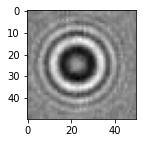

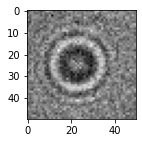

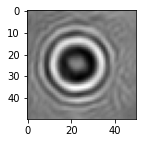

orig
nsy
rec


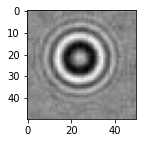

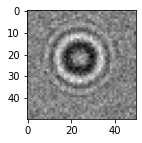

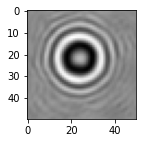

orig
nsy
rec


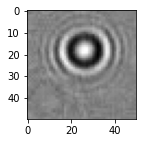

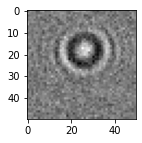

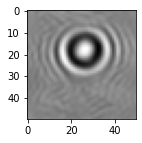

orig
nsy
rec


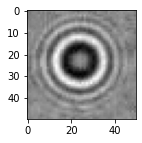

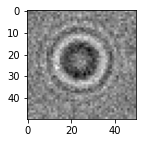

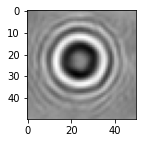

orig
nsy
rec


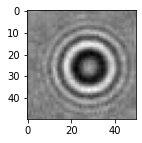

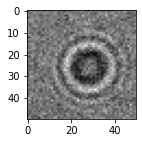

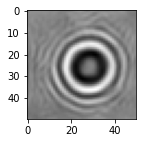

orig
nsy
rec


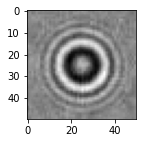

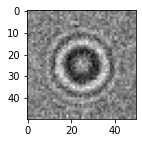

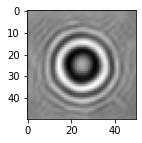

orig
nsy
rec


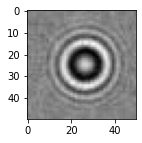

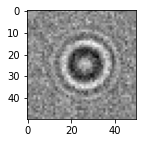

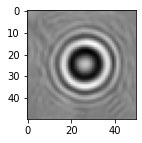

orig
nsy
rec


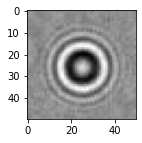

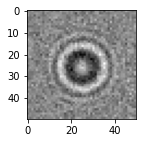

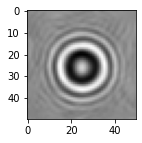

orig
nsy
rec


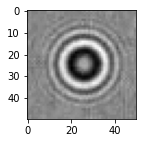

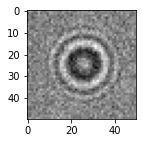

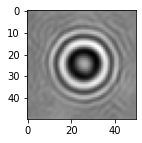

orig
nsy
rec


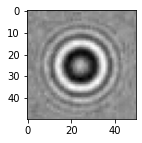

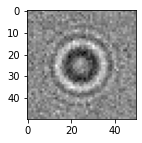

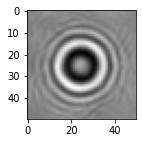

orig
nsy
rec


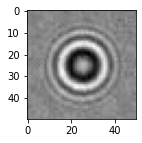

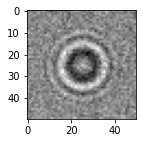

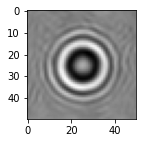

1.0
SNR 5
[4.337430568579524, 7.086595659967159, 6.022831183506096, 6.487741998822095, 5.8128756231464305, 5.467220539127393, 8.129572939788462, 7.547332218913553, 8.935608422100058, 8.504458685180737, 5.12468406883387, 5.528485155710889, 2.688933703898382, -3.475166528417123, 9.141021502644652, 7.526716879264136, 6.673985834529777, 9.946297304575863, 6.3717302596037335, 6.133459340612875, 4.987977885928144, 8.69965651819709, 8.506670322712544, 6.319541134982099, 9.152638252143522, 7.947654520332605, 10.82255956613474, 5.94381994568381, 7.19917746750961, 8.711350592595362, 6.995790480730211, 5.6095270613399855, 7.341596422334641, 3.9112484053859973, 6.050025167375301, 9.058242019262153, 8.449012162171957, 6.318676603706395, 4.518689670910787, 7.64510539526483, 9.426514580011206, 6.531815549718065, 6.811747499483971, 4.334945913470019, 8.277780889436066, 6.104981452960331, 7.615643514439984, 6.331988208290134, 7.6129105063418905]
[14.852965454457792, 15.365707706477199, 14.5595471564826

In [ ]:
for i in range(len(noise_test)):
  print("orig")
  plt.figure(figsize=(2,2))
  plt.imshow(np.reshape(noise_test_out[i],(sz,sz)),cmap='gray')
  plt.imsave("drive/My Drive/convinputimg/convinp"+str(i)+".png",np.reshape(noise_test_out[i],(sz,sz)),cmap='gray')
  print("nsy")
  plt.figure(figsize=(2,2))
  plt.imshow(np.reshape(noise_test[i],(sz,sz)),cmap='gray')
  plt.imsave("drive/My Drive/convnsyimg/convnsy"+str(i)+".png",np.reshape(noise_test[i],(sz,sz)),cmap='gray')
  print("rec")
  plt.figure(figsize=(2,2))
  plt.imshow(np.reshape(img[i],(sz,sz)),cmap='gray')
  plt.imsave("drive/My Drive/convopimg/convop"+str(i)+".png",np.reshape(img[i],(sz,sz)),cmap='gray')
  plt.show()
a = noise_test_out
#b = np.true_divide(noise_test,255)
aa = []
bb = []
cc = []
for lk in range(noise_test_out.shape[0]):
  a = noise_test_out[lk]
  a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
  aa.append(a)
  b = noise_test[lk]
  b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
  bb.append(b)
  c = img[lk]
  #c = np.true_divide(recon,255)
  c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
  cc.append(c)
aa = np.array(aa)
bb = np.array(bb)
cc = np.array(cc)
print(np.amax(bb))
import math
import matplotlib.pyplot as pypt
def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[25][:]
        l = noisar[25][:]
        m = reconar[25][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar
snratio = []
snrinar = []
snroutar =  []
snratio,snrinar,snroutar = snr5(aa,bb,cc)
print("SNR 5")
print(snratio)
print(snrinar)
print(snroutar)
print(np.mean(snratio))
print(np.mean(snrinar))
print(np.mean(snroutar))
print(np.std(snratio))
print(np.std(snrinar))
print(np.std(snroutar))

In [ ]:
print(np.std(snratio))
print(np.std(snrinar))
print(np.std(snroutar))

2.2235523596390285
2.380719429843103
2.935571740763618


###Traditonal Denoising autoencoder using keras

In [ ]:
'''
test output => noise_test_out
test input => noise_test
test reconstruction => recon
'''
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Dense
from keras.models import Model
#(x_train, _), (x_test, _) = mnist.load_data()
'''
x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.'''
#x_train = np.reshape(x_train, (len(x_train), 44*44))  # adapt this if using `channels_first` image data format
#x_test = np.reshape(x_test, (len(x_test), 784))  # adapt this if using `channels_first` image data format



input_img = Input(shape=(44*44,))
encoded = Dense(1024, activation='relu')(input_img)
encoded = Dense(512, activation='relu')(encoded)
encoded = Dense(256, activation='relu')(encoded)
decoded = Dense(512, activation='relu')(encoded)
decoded = Dense(1024, activation='relu')(decoded)
decoded = Dense(44*44, activation='relu')(encoded)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

autoencoder.fit(noise_trai,noise_train_out,
                epochs=100,
                batch_size=5,
                shuffle=True)
img=autoencoder.predict(noise_test)
print(len(noise_test))


ValueError: ignored

In [ ]:
for i in range(len(noise_test)):
  print("orig")
  plt.figure(figsize=(2,2))
  plt.imshow(np.reshape(noise_test_out[i],(44,44)),cmap='gray')
  #plt.imsave("drive/My Drive/slfninp/slfninp"+str(i)+".png",np.resize(noise_test_out[i],(44,44)),cmap='gray')
  print("nsy")
  plt.figure(figsize=(2,2))
  plt.imshow(np.reshape(noise_test[i],(44,44)),cmap='gray')
  #plt.imsave("drive/My Drive/slfnnsy/slfnnsy"+str(i)+".png",np.resize(noise_test[i],(44,44)),cmap='gray')
  print("rec")
  plt.figure(figsize=(2,2))
  plt.imshow(np.reshape(img[i],(44,44)),cmap='gray')
  #plt.imsave("drive/My Drive/slfnop/slfnop"+str(i)+".png",np.resize(img[i],(44,44)),cmap='gray')
  plt.show()

In [ ]:
recon = np.array(recon)
print(recon.shape)

In [ ]:
#a = noise_test_out
#b = np.true_divide(noise_test,255)
aa = []
bb = []
cc = []
for lk in range(noise_test_out.shape[0]):
  a = noise_test_out[lk]
  a  = (a - np.amin(a))/(np.amax(a)-np.amin(a))
  aa.append(a)
  b = noise_test[lk]
  b  = (b - np.amin(b))/(np.amax(b)-np.amin(b))
  bb.append(b)
  c = recon[lk]
  #c = np.true_divide(recon,255)
  c  = (c - np.amin(c))/(np.amax(c)-np.amin(c))
  cc.append(c)
aa = np.array(aa)
bb = np.array(bb)
cc = np.array(cc)
print(np.amax(bb))

In [ ]:

import math
import matplotlib.pyplot as pypt
def snr5(imgarr,noisarr,reconarr):
    imgar = []
    noisar  = []
    reconar = []
    snrfinal = []
    snr = []
    a = []
    b = []
    k = []
    l = []
    m = []
    snrinar = []
    snroutar = []
    for t in range(imgarr.shape[0]):
        imgar = imgarr[t].reshape(sz,sz)
        noisar = noisarr[t].reshape(sz,sz)
        reconar = reconarr[t].reshape(sz,sz)
        k = imgar[22][:]
        l = noisar[22][:]
        m = reconar[22][:]
        a = np.subtract(k,l)
        b = np.subtract(k,m)
        diff1 = sum(map(lambda i : i * i, a))
        diff2 = sum(map(lambda i : i * i, b))
        img = sum(map(lambda i: i * i,imgar[sz//2][:]))
        snrin =  10 * math.log(img/diff1,10)
        snrout =  10 * math.log(img/diff2,10)
        snrimp = snrout - snrin
        #if(snrimp>0):
        snrfinal.append(snrimp)
        snrinar.append(snrin)
        snroutar.append(snrout)
        snr = []
        imgar = []
        noisar  = []
        reconar = []
    return snrfinal,snrinar,snroutar

In [ ]:

snratio = []
snrinar = []
snroutar =  []
snratio,snrinar,snroutar = snr5(aa,bb,cc)
print("SNR 5")
print(snratio)
print(snrinar)
print(snroutar)
print(np.mean(snratio))
print(np.mean(snrinar))
print(np.mean(snroutar))